In [1]:
import pandas as pd
import datetime
import ta
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import plotly.express as px
import numpy as np
from scipy import stats
from scipy.stats import linregress, pearsonr
from scipy.stats import f
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Historical Trend of WTI Crude Oil / Henry Hub Natural Gas

In [2]:
wti = pd.read_csv("resources/wti_daily_f.csv")
ng = pd.read_csv("resources/naturalGas_daily_f.csv")


In [3]:
wti_df = wti[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_wti', 'Volume': 'volume_wti'})
ng_df = ng[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_ng', 'Volume': 'volume_ng'})


In [4]:
wti_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5030 entries, 0 to 5029
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        5030 non-null   object 
 1   close_wti   5030 non-null   float64
 2   volume_wti  5030 non-null   int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 118.0+ KB


In [5]:
ng_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5031 entries, 0 to 5030
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       5031 non-null   object 
 1   close_ng   5031 non-null   float64
 2   volume_ng  5031 non-null   int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 118.0+ KB


In [6]:
for df in [wti_df, ng_df]:
    df['Date'] = pd.to_datetime(df['Date'])

In [7]:
comm_full = pd.merge(wti_df,ng_df, on='Date', how='outer')
comm_full.head()

,Date,close_wti,volume_wti,close_ng,volume_ng
0,2004-12-01,45.490002,146703.0,7.413,32354
1,2004-12-02,43.250000,158715.0,6.811,35709
2,2004-12-03,42.540001,109157.0,6.796,20993
3,2004-12-06,42.980000,82611.0,6.923,23903
4,2004-12-07,41.459999,109069.0,6.621,39556


In [8]:
comm_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5031 entries, 0 to 5030
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Date        5031 non-null   datetime64[ns]
 1   close_wti   5030 non-null   float64       
 2   volume_wti  5030 non-null   float64       
 3   close_ng    5031 non-null   float64       
 4   volume_ng   5031 non-null   int64         
dtypes: datetime64[ns](1), float64(3), int64(1)
memory usage: 235.8 KB


In [9]:
comm_full[comm_full['close_wti'].isna()]

,Date,close_wti,volume_wti,close_ng,volume_ng
5030,2023-11-23,NaN,NaN,2.934,59224


In [10]:
comm_full = comm_full.dropna(subset=['close_wti']).reset_index(drop=True)
comm_full.tail()

,Date,close_wti,volume_wti,close_ng,volume_ng
5025,2024-11-22,71.239998,408207.0,3.129,95807
5026,2024-11-25,68.940002,380922.0,3.369,108485
5027,2024-11-26,68.769997,292138.0,3.431,222049
5028,2024-11-27,68.720001,227215.0,3.204,214291
5029,2024-11-29,68.000000,291408.0,3.363,163060


In [11]:
comm_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5030 entries, 0 to 5029
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Date        5030 non-null   datetime64[ns]
 1   close_wti   5030 non-null   float64       
 2   volume_wti  5030 non-null   float64       
 3   close_ng    5030 non-null   float64       
 4   volume_ng   5030 non-null   int64         
dtypes: datetime64[ns](1), float64(3), int64(1)
memory usage: 196.6 KB


In [12]:
# Correlation between WTI and Henry Hub (starting from Dec 2004 - Nov 2024) 
corr_matrix = comm_full.drop(columns=['Date']).corr()
corr_matrix

,close_wti,volume_wti,close_ng,volume_ng
close_wti,1.000000,-0.317230,0.319044,-0.059830
volume_wti,-0.317230,1.000000,-0.430933,0.452627
close_ng,0.319044,-0.430933,1.000000,-0.520225
volume_ng,-0.059830,0.452627,-0.520225,1.000000


In [13]:
def add_trendline(x, y):
    slope, intercept, _, _, _ = linregress(x, y)
    return slope * x + intercept

In [14]:
def plot_comm_vs_factor(comm_value, comm_label,comm_unit,factor_value, factor_label,factor_unit,time_frame, factor_df, comm_df):
  
    fig = go.Figure()


    fig.add_trace(go.Scatter(
        x=comm_df['Date'], 
        y=comm_df[comm_value], 
        mode='lines', 
        name=comm_label
    ))
        

    fig.add_trace(go.Scatter(
        x=comm_df['Date'], 
        y=factor_df[factor_value], 
        mode='lines', 
        name=factor_label, 
        yaxis='y2'
    ))

    
    date_num = comm_df['Date'].map(pd.Timestamp.toordinal)


    slope_comm, intercept_comm, *_ = linregress(date_num, comm_df[comm_value])
    comm_trendline = slope_comm * date_num + intercept_comm
    fig.add_trace(go.Scatter(
        x=comm_df['Date'], 
        y=comm_trendline, 
        mode='lines', 
        name=f'{comm_label} Trendline', 
        line=dict(dash='dash', color='blue')
    ))


    slope_factor, intercept_factor, *_ = linregress(date_num, factor_df[factor_value])
    factor_trendline = slope_factor * date_num + intercept_factor
    fig.add_trace(go.Scatter(
        x=comm_df['Date'], 
        y=factor_trendline, 
        mode='lines', 
        name=f'{factor_label} Trendline', 
        line=dict(dash='dash', color='red'),
        yaxis='y2'
    ))

    fig.update_layout(
        title=f'{comm_label} with {factor_label} ({time_frame})',
        xaxis_title='Date',
        yaxis=dict(
            title=f'{comm_label}({comm_unit})',
            titlefont=dict(color='blue'),
            tickfont=dict(color='blue'),
            showgrid=True,
        ),
        yaxis2=dict(
            title=f'{factor_label}({factor_unit})',
            titlefont=dict(color='red'),
            tickfont=dict(color='red'),
            overlaying='y',
            side='right',
            showgrid=False
        ),
        legend=dict(x=1.1, y=1), 
        template='plotly_white',
    )

    fig.show()

    
    correlation, _ = pearsonr(factor_df[factor_value], comm_df[comm_value])

    print(f"Quick Summary")
    print(f"--------------")
    print(f"The Pearson correlation between {comm_label} and {factor_label} is: {round(correlation, 3)}")
    print(f"The slope of the {comm_label} trendline is: {round(slope_comm, 6)}")
    print(f"The slope of the {factor_label} trendline is: {round(slope_factor, 6)}")

In [15]:
plot_comm_vs_factor(
    comm_value='close_wti', 
    comm_label='WTI Futures Price',
    comm_unit = 'USD/Barrel',
    factor_value='close_ng', 
    factor_label='Henry Hub Futures Price',
    factor_unit = 'USD/MMBtu',
    time_frame = 'From Dec-2004 to Nov-2024',
    factor_df=comm_full, 
    comm_df=comm_full
)

Quick Summary
--------------
The Pearson correlation between WTI Futures Price and Henry Hub Futures Price is: 0.319
The slope of the WTI Futures Price trendline is: -0.00117
The slope of the Henry Hub Futures Price trendline is: -0.000669


# 2. Correlation - CPI v.s. WTI Crude Oil / Henry Hub Natural Gas
---
- **Hypothesis Testing**: Significant correlations across the following periods:  
    - **2.1 Past Decade**: Dec 2014 – Nov 2024  
    - **2.2 COVID-19 Period**: Mar 2020 – May 2023  
    - **2.3 Post-COVID Period**: Jun 2023 – Nov 2024  

In [16]:
def compare_correlation(short_df, long_df):

    if short_df.shape != long_df.shape:
        raise ValueError("The correlation dataframes must have the same shape")
    

    correlation_diff = short_df - long_df


    comparison_matrix = correlation_diff.applymap(
        lambda x: 'High' if x > 0 else 'Low' if x < 0 else 'Same'
    )

    
    for i in comparison_matrix.index:
        comparison_matrix.loc[i, i] = 'Same'
    
    return comparison_matrix

In [17]:
def correlation_change(short_df, long_df):

    if short_df.shape != long_df.shape:
        raise ValueError("The correlation dataframes must have the same shape")
    

    percentage_change = ((short_df - long_df) / long_df.abs()) * 100
    

    for i in percentage_change.index:
        percentage_change.loc[i, i] = 0.0
    
    return percentage_change

In [18]:
def corr_statsig(correlations, n, alpha=0.05):


    for key, r in correlations.items():

        t_stat = r * np.sqrt(n - 2) / np.sqrt(1 - r**2)
        df = n - 2 
        p_value = 2 * stats.t.sf(np.abs(t_stat), df)
        

        is_significant = p_value < alpha
        

        print(f"{key}:")
        print(f"  Correlation (r): {r:.4f}")
        print(f"  t-statistic: {t_stat:.4f}")
        print(f"  p-value: {p_value:.4f}")
        print(f"  Significant: {'Yes' if is_significant else 'No'}")
        print("-" * 50)

In [19]:
cpi_df = pd.read_csv("outputs/cpi_2014Dec_2024Nov.csv")
cpi_df.head()

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE
0,2014-12-01,0.65312,1.62242,-11.06770,-20.82224,3.71750,0.73226
1,2015-01-01,-0.22993,1.63163,-20.13821,-34.59511,1.66763,0.04140
2,2015-02-01,-0.08703,1.68808,-18.76723,-31.93502,0.81750,0.17070
3,2015-03-01,-0.02203,1.74538,-17.68436,-28.07911,-2.93954,0.19935
4,2015-04-01,-0.10403,1.80283,-18.52488,-30.25245,-1.26697,0.11032


In [20]:
cpi_df['Date'] = pd.to_datetime(cpi_df['Date'])

In [21]:
cpi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Date                  120 non-null    datetime64[ns]
 1   CPI_all_items         120 non-null    float64       
 2   CPI_excl_food_energy  120 non-null    float64       
 3   CPI_Energy            120 non-null    float64       
 4   CPI_Energy_Commo      120 non-null    float64       
 5   CPI_Energy_Ser        120 non-null    float64       
 6   PCE                   120 non-null    float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 6.7 KB


In [22]:
csi_df = pd.read_csv("outputs/csi_2014Dec_2024Nov.csv")
csi_df.head()

,observation_date,CSI
0,2014-12-01,13.45455
1,2015-01-01,20.81281
2,2015-02-01,16.91176
3,2015-03-01,16.25000
4,2015-04-01,14.03092


## 2.1 Past Decade: December 2014 – November 2024
--- 
- hypothesis test (Pearson correlation)
- correlation differences

In [23]:
comm_decade = comm_full[(comm_full['Date'] >= '2014-12-01')&
                                  (comm_full['Date'] <= '2024-11-01')].reset_index(drop=True)

comm_decade.head()

,Date,close_wti,volume_wti,close_ng,volume_ng
0,2014-12-01,69.000000,504122.0,4.007,181558
1,2014-12-02,66.879997,360300.0,3.874,144382
2,2014-12-03,67.379997,293483.0,3.805,131446
3,2014-12-04,66.809998,237011.0,3.649,143648
4,2014-12-05,65.839996,276529.0,3.802,162625


In [24]:
comm_decade['YearMonth'] = comm_decade['Date'].dt.to_period('M')
comm_decade.head()

,Date,close_wti,volume_wti,close_ng,volume_ng,YearMonth
0,2014-12-01,69.000000,504122.0,4.007,181558,2014-12
1,2014-12-02,66.879997,360300.0,3.874,144382,2014-12
2,2014-12-03,67.379997,293483.0,3.805,131446,2014-12
3,2014-12-04,66.809998,237011.0,3.649,143648,2014-12
4,2014-12-05,65.839996,276529.0,3.802,162625,2014-12


In [25]:
monthly_comm_decade = comm_decade.groupby('YearMonth').agg(
    avg_price_wti=('close_wti', 'mean'),
    total_volume_wti=('volume_wti', 'sum'),
    avg_price_ng=('close_ng', 'mean'),
    total_volume_ng=('volume_ng', 'sum')
).reset_index()

monthly_comm_decade.head()

,YearMonth,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
0,2014-12,59.289545,6919717.0,3.508591,2698345
1,2015-01,47.325500,7699363.0,2.929350,2754920
2,2015-02,50.724736,8798437.0,2.754947,2600280
3,2015-03,47.854091,8046270.0,2.746909,2450063
4,2015-04,54.628096,7959153.0,2.591333,2509146


In [26]:
monthly_full_decade = pd.concat([cpi_df, csi_df, monthly_comm_decade,], axis=1)
monthly_full_decade.head()

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,observation_date,CSI,YearMonth,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
0,2014-12-01,0.65312,1.62242,-11.06770,-20.82224,3.71750,0.73226,2014-12-01,13.45455,2014-12,59.289545,6919717.0,3.508591,2698345
1,2015-01-01,-0.22993,1.63163,-20.13821,-34.59511,1.66763,0.04140,2015-01-01,20.81281,2015-01,47.325500,7699363.0,2.929350,2754920
2,2015-02-01,-0.08703,1.68808,-18.76723,-31.93502,0.81750,0.17070,2015-02-01,16.91176,2015-02,50.724736,8798437.0,2.754947,2600280
3,2015-03-01,-0.02203,1.74538,-17.68436,-28.07911,-2.93954,0.19935,2015-03-01,16.25000,2015-03,47.854091,8046270.0,2.746909,2450063
4,2015-04-01,-0.10403,1.80283,-18.52488,-30.25245,-1.26697,0.11032,2015-04-01,14.03092,2015-04,54.628096,7959153.0,2.591333,2509146


In [27]:
monthly_full_decade = monthly_full_decade.drop(columns=['observation_date'])
monthly_full_decade.head()

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,YearMonth,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
0,2014-12-01,0.65312,1.62242,-11.06770,-20.82224,3.71750,0.73226,13.45455,2014-12,59.289545,6919717.0,3.508591,2698345
1,2015-01-01,-0.22993,1.63163,-20.13821,-34.59511,1.66763,0.04140,20.81281,2015-01,47.325500,7699363.0,2.929350,2754920
2,2015-02-01,-0.08703,1.68808,-18.76723,-31.93502,0.81750,0.17070,16.91176,2015-02,50.724736,8798437.0,2.754947,2600280
3,2015-03-01,-0.02203,1.74538,-17.68436,-28.07911,-2.93954,0.19935,16.25000,2015-03,47.854091,8046270.0,2.746909,2450063
4,2015-04-01,-0.10403,1.80283,-18.52488,-30.25245,-1.26697,0.11032,14.03092,2015-04,54.628096,7959153.0,2.591333,2509146


In [28]:
corr_decade = monthly_full_decade.drop(columns=['Date','YearMonth']).corr()
corr_decade

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
CPI_all_items,1.000000,0.923660,0.834369,0.765310,0.886510,0.994797,-0.364491,0.837872,-0.354758,0.771960,-0.264532
CPI_excl_food_energy,0.923660,1.000000,0.581893,0.502767,0.767040,0.932039,-0.205439,0.827333,-0.505719,0.657092,-0.322235
CPI_Energy,0.834369,0.581893,1.000000,0.987640,0.760350,0.809396,-0.340937,0.651666,-0.025593,0.691382,-0.129933
CPI_Energy_Commo,0.765310,0.502767,0.987640,1.000000,0.657860,0.739968,-0.267183,0.600045,0.031912,0.614197,-0.102336
CPI_Energy_Ser,0.886510,0.767040,0.760350,0.657860,1.000000,0.881798,-0.479249,0.669358,-0.329050,0.820383,-0.273575
PCE,0.994797,0.932039,0.809396,0.739968,0.881798,1.000000,-0.347591,0.838897,-0.385371,0.757738,-0.282583
CSI,-0.364491,-0.205439,-0.340937,-0.267183,-0.479249,-0.347591,1.000000,-0.090956,0.000234,-0.481027,-0.002356
avg_price_wti,0.837872,0.827333,0.651666,0.600045,0.669358,0.838897,-0.090956,1.000000,-0.462858,0.625353,-0.243117
total_volume_wti,-0.354758,-0.505719,-0.025593,0.031912,-0.329050,-0.385371,0.000234,-0.462858,1.000000,-0.246431,0.389619
avg_price_ng,0.771960,0.657092,0.691382,0.614197,0.820383,0.757738,-0.481027,0.625353,-0.246431,1.000000,-0.285655


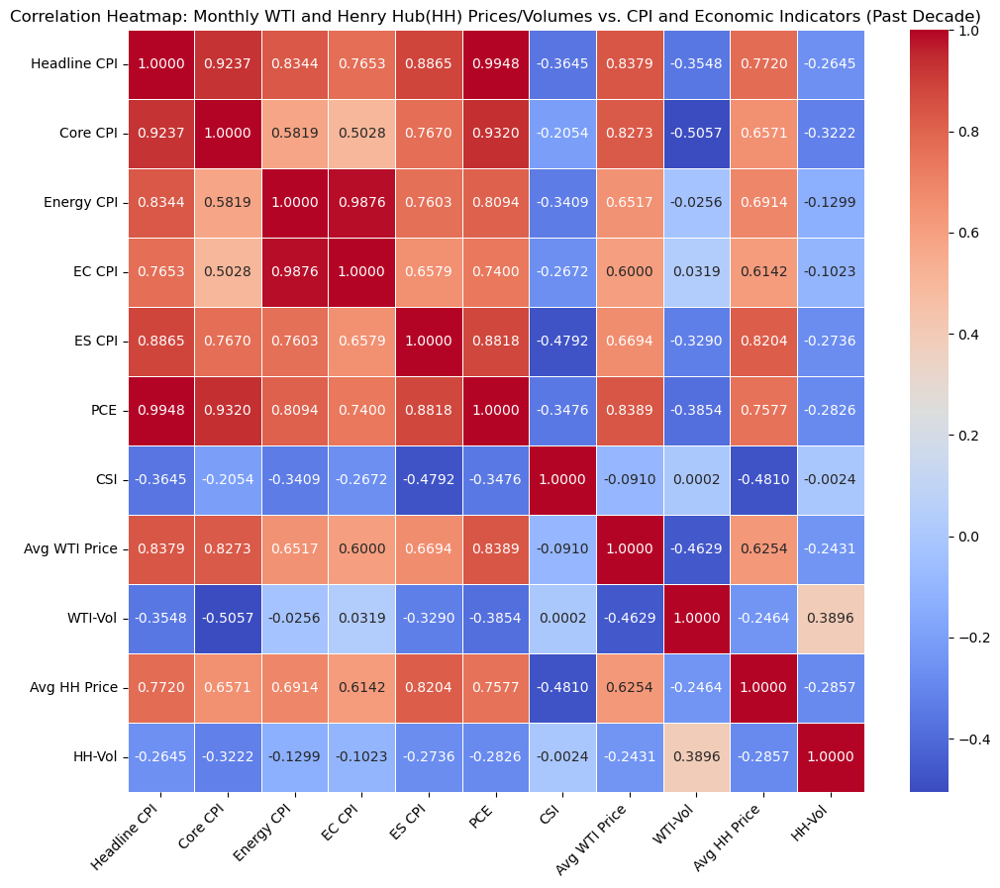

In [29]:
plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(corr_decade, annot=True, fmt=".4f", cmap='coolwarm', linewidths=0.5)

#EC: Energy Commodities
#ES: Energy Service
tick_labels = ["Headline CPI","Core CPI","Energy CPI", "EC CPI", "ES CPI", "PCE","CSI",
               "Avg WTI Price","WTI-Vol","Avg HH Price","HH-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Monthly WTI and Henry Hub(HH) Prices/Volumes vs. CPI and Economic Indicators (Past Decade)')

plt.savefig('outputs/heatmap_hhWTI_CPI_10yrs.png')

plt.show()

In [30]:
monthly_full_decade.columns

Index(['Date', 'CPI_all_items', 'CPI_excl_food_energy', 'CPI_Energy',
       'CPI_Energy_Commo', 'CPI_Energy_Ser', 'PCE', 'CSI', 'YearMonth',
       'avg_price_wti', 'total_volume_wti', 'avg_price_ng', 'total_volume_ng'],
      dtype='object')

In [31]:
plot_comm_vs_factor(
    comm_value='avg_price_wti', 
    comm_label='Avg Monthly WTI Futures Price',
    comm_unit='USD/Barrel',
    factor_value='CPI_Energy_Ser', 
    factor_label='Energy Service CPI',
    factor_unit='YoY % Change',
    time_frame='From Dec 2014 to Nov 2024',
    factor_df=monthly_full_decade, 
    comm_df=monthly_full_decade
)

Quick Summary
--------------
The Pearson correlation between Avg Monthly WTI Futures Price and Energy Service CPI is: 0.669
The slope of the Avg Monthly WTI Futures Price trendline is: 0.011293
The slope of the Energy Service CPI trendline is: 0.002599


In [32]:
plot_comm_vs_factor(
    comm_value='avg_price_ng', 
    comm_label='Avg Monthly Henry Hub Futures Price',
    comm_unit='USD/MMBtu',
    factor_value='CPI_Energy_Ser', 
    factor_label='Energy Service CPI',
    factor_unit='YoY % Change',
    time_frame='From Dec 2014 to Nov 2024',
    factor_df=monthly_full_decade, 
    comm_df=monthly_full_decade
)

Quick Summary
--------------
The Pearson correlation between Avg Monthly Henry Hub Futures Price and Energy Service CPI is: 0.82
The slope of the Avg Monthly Henry Hub Futures Price trendline is: 0.000303
The slope of the Energy Service CPI trendline is: 0.002599


## 2.2 COVID-19 Period: March 2020 – May 2023
--- 
- hypothesis test (Pearson correlation)
- correlation differences

In [33]:
# "Covid Period" (according to WHO)
monthly_full_covid = monthly_full_decade[(monthly_full_decade['Date'] >= '2020-03-01')&
                                  (monthly_full_decade['Date'] <= '2023-05-01')].reset_index(drop=True)

corr_covid = monthly_full_covid.drop(columns=['Date','YearMonth']).corr()
corr_covid

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
CPI_all_items,1.000000,0.956405,0.848461,0.767435,0.939450,0.996820,-0.066666,0.948642,-0.328271,0.824596,-0.599242
CPI_excl_food_energy,0.956405,1.000000,0.677621,0.586824,0.884633,0.959655,0.012038,0.892474,-0.343764,0.716385,-0.556488
CPI_Energy,0.848461,0.677621,1.000000,0.986478,0.750679,0.841403,0.006711,0.812936,-0.145813,0.732285,-0.515937
CPI_Energy_Commo,0.767435,0.586824,0.986478,1.000000,0.637275,0.762570,0.087315,0.734550,-0.079817,0.634236,-0.462203
CPI_Energy_Ser,0.939450,0.884633,0.750679,0.637275,1.000000,0.931466,-0.185473,0.886522,-0.398156,0.883636,-0.616024
PCE,0.996820,0.959655,0.841403,0.762570,0.931466,1.000000,-0.032694,0.950156,-0.341302,0.803140,-0.601012
CSI,-0.066666,0.012038,0.006711,0.087315,-0.185473,-0.032694,1.000000,-0.119895,0.051254,-0.385826,-0.118636
avg_price_wti,0.948642,0.892474,0.812936,0.734550,0.886522,0.950156,-0.119895,1.000000,-0.437907,0.795404,-0.597972
total_volume_wti,-0.328271,-0.343764,-0.145813,-0.079817,-0.398156,-0.341302,0.051254,-0.437907,1.000000,-0.331559,0.414923
avg_price_ng,0.824596,0.716385,0.732285,0.634236,0.883636,0.803140,-0.385826,0.795404,-0.331559,1.000000,-0.507430


In [34]:
# Calculate the correlation difference
# dataframe 1 = corr_decade: Dec 2021 ~ Nov 2024
# dataframe 2 = corr_covid: Feb 2020 ~ May 2023
comparison_matrix_covid = compare_correlation(corr_covid, corr_decade)
comparison_matrix_covid

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
CPI_all_items,Same,High,High,High,High,High,High,High,High,High,Low
CPI_excl_food_energy,High,Same,High,High,High,High,High,High,High,High,Low
CPI_Energy,High,High,Same,Low,Low,High,High,High,Low,High,Low
CPI_Energy_Commo,High,High,Low,Same,Low,High,High,High,Low,High,Low
CPI_Energy_Ser,High,High,Low,Low,Same,High,High,High,Low,High,Low
PCE,High,High,High,High,High,Same,High,High,High,High,Low
CSI,High,High,High,High,High,High,Same,Low,High,High,Low
avg_price_wti,High,High,High,High,High,High,Low,Same,High,High,Low
total_volume_wti,High,High,Low,Low,Low,High,High,High,Same,Low,High
avg_price_ng,High,High,High,High,High,High,High,High,Low,Same,Low


In [35]:
# Percentage Change in Correlation (Past Decade vs. COVID-19 Period)
percent_change_full_covid = correlation_change(corr_covid, corr_decade)
percent_change_full_covid

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
CPI_all_items,0.000000,3.545114,1.688862,0.277621,5.971657,0.203411,81.709875,13.220361,7.466391,6.818567,-126.529176
CPI_excl_food_energy,3.545114,0.000000,16.451038,16.718853,15.330777,2.963035,105.859428,7.873585,32.024677,9.023548,-72.696434
CPI_Energy,1.688862,16.451038,0.000000,-0.117643,-1.271895,3.954486,101.968436,24.747439,-469.747116,5.916117,-297.077960
CPI_Energy_Commo,0.277621,16.718853,-0.117643,0.000000,-3.129010,3.054457,132.679851,22.415784,-350.113599,3.262722,-351.651644
CPI_Energy_Ser,5.971657,15.330777,-1.271895,-3.129010,0.000000,5.632608,61.299214,32.443681,-21.001894,7.710165,-125.175715
PCE,0.203411,2.963035,3.954486,3.054457,5.632608,0.000000,90.594060,13.262549,11.435306,5.991865,-112.685174
CSI,81.709875,105.859428,101.968436,132.679851,61.299214,90.594060,0.000000,-31.816448,21796.143370,19.791280,-4934.835001
avg_price_wti,13.220361,7.873585,24.747439,22.415784,32.443681,13.262549,-31.816448,0.000000,5.390673,27.192716,-145.960849
total_volume_wti,7.466391,32.024677,-469.747116,-350.113599,-21.001894,11.435306,21796.143370,5.390673,0.000000,-34.544376,6.494504
avg_price_ng,6.818567,9.023548,5.916117,3.262722,7.710165,5.991865,19.791280,27.192716,-34.544376,0.000000,-77.637126


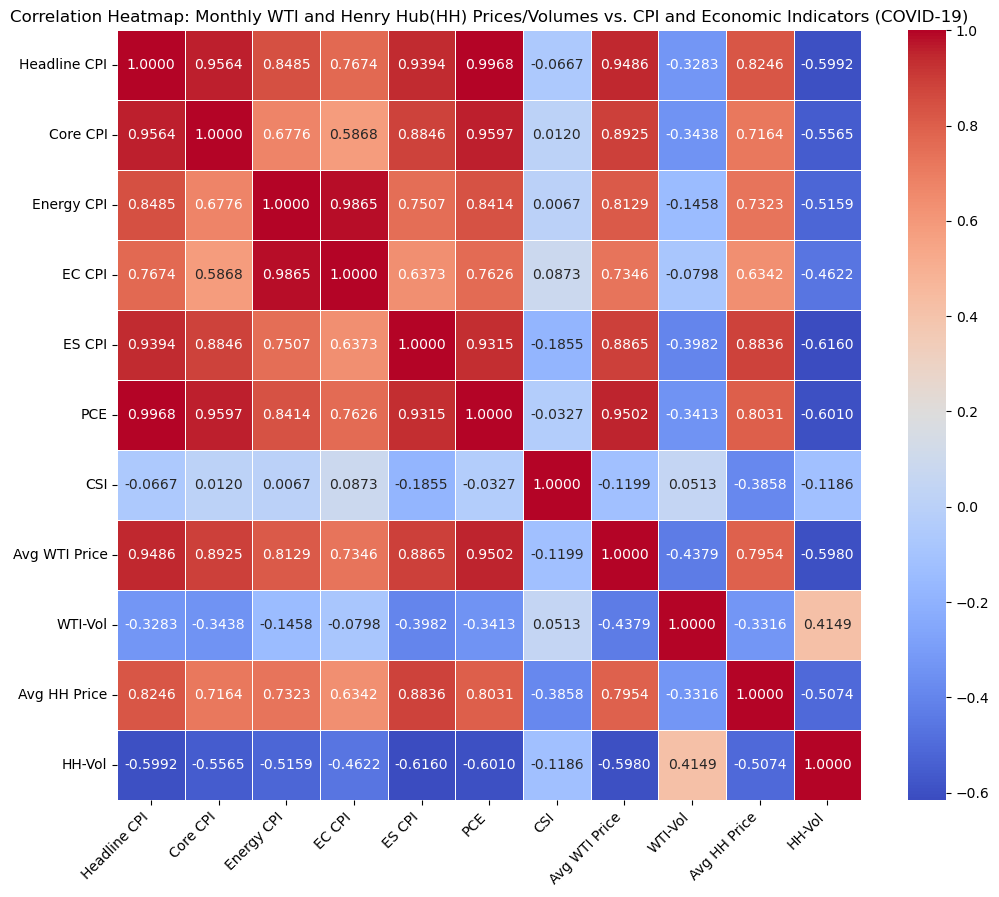

In [36]:
plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(corr_covid, annot=True,fmt=".4f", cmap='coolwarm', linewidths=0.5)

#EC: Energy Commodities
#ES: Energy Service
tick_labels = ["Headline CPI","Core CPI","Energy CPI", "EC CPI", "ES CPI", "PCE","CSI",
               "Avg WTI Price","WTI-Vol","Avg HH Price","HH-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Monthly WTI and Henry Hub(HH) Prices/Volumes vs. CPI and Economic Indicators (COVID-19)')

plt.savefig('outputs/heatmap_hhWTI_CPI_covid.png')

plt.show()

## 2.3 Post-COVID Period: June 2023 – November 2024
--- 
- hypothesis test (Spearman Rank Correlation)
- correlation differences

In [37]:
def plot_comm_vs_cpi_spearman(comm_value, comm_label, comm_unit, cpi_value, cpi_label, cpi_unit, title_period, cpi_cop_alu_pcovid):

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=cpi_cop_alu_pcovid['Date'], 
        y=cpi_cop_alu_pcovid[comm_value], 
        mode='markers', 
        name=comm_label
    ))

    fig.add_trace(go.Scatter(
        x=cpi_cop_alu_pcovid['Date'], 
        y=cpi_cop_alu_pcovid[cpi_value], 
        mode='lines',
        name=cpi_label, 
        yaxis='y2'
    ))

    date_num = cpi_cop_alu_pcovid['Date'].map(pd.Timestamp.toordinal)


    slope_comm, intercept_comm, *_ = linregress(date_num, cpi_cop_alu_pcovid[comm_value])
    comm_trendline = slope_comm * date_num + intercept_comm
    fig.add_trace(go.Scatter(
        x=cpi_cop_alu_pcovid['Date'], 
        y=comm_trendline, 
        mode='lines', 
        name=f'{comm_label} Trendline', 
        line=dict(dash='dash', color='blue')
    ))

    slope_cpi, intercept_cpi, *_ = linregress(date_num, cpi_cop_alu_pcovid[cpi_value])
    cpi_trendline = slope_cpi * date_num + intercept_cpi
    fig.add_trace(go.Scatter(
        x=cpi_cop_alu_pcovid['Date'], 
        y=cpi_trendline, 
        mode='lines', 
        name=f'{cpi_label} Trendline', 
        line=dict(dash='dash', color='red'),
        yaxis='y2'
    ))


    fig.update_layout(
        title=f'{comm_label} with {cpi_label} ({title_period})',
        xaxis_title='Date',
        yaxis=dict(
            title=f'{comm_label} ({comm_unit})',
            titlefont=dict(color='blue'),
            tickfont=dict(color='blue'),
        ),
        yaxis2=dict(
            title=f'{cpi_label} ({cpi_unit})',
            titlefont=dict(color='red'),
            tickfont=dict(color='red'),
            overlaying='y',
            side='right',
            showgrid=False
        ),
        legend=dict(x=1.1, y=1),template='plotly_white'
    )


    fig.show()


    spearman_corr, p_value = stats.spearmanr(cpi_cop_alu_pcovid[cpi_value], cpi_cop_alu_pcovid[comm_value])

    print(f"Quick Summary")
    print(f"--------------")
    print(f"The Spearman Rank Correlation between {comm_label} and {cpi_label} is: {round(spearman_corr, 3)}")
    print(f"The slope of the {comm_label} trendline is: {round(slope_comm, 6)}")
    print(f"The slope of the {cpi_label} trendline is: {round(slope_cpi, 6)}")
    

In [38]:
def corr_statsig_spearman(x, y, alpha=0.05, label=""):
    
    spearman_corr, p_value = stats.spearmanr(x, y)
    
    is_significant = p_value < alpha
    
    print(f"{label}:")
    print(f"  Correlation (r): {spearman_corr:.4f}")
    print(f"  P-value: {p_value:.4f}")
    print(f"  Significant: {'Yes' if is_significant else 'No'}\n")
    return spearman_corr, p_value, is_significant

In [39]:
monthly_full_pcovid = monthly_full_decade[(monthly_full_decade['Date'] >= '2023-06-01')&
                                  (monthly_full_decade['Date'] <= '2024-11-01')].reset_index(drop=True)
monthly_full_pcovid.head()

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,YearMonth,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
0,2023-06-01,3.05326,4.85522,-16.67792,-26.92468,-1.12299,3.26157,28.40000,2023-06,70.274285,6857383.0,2.474619,3206300
1,2023-07-01,3.27178,4.70760,-12.47732,-20.57423,-1.16982,3.37385,38.83495,2023-07,76.034500,6301345.0,2.636550,2240758
2,2023-08-01,3.71872,4.41280,-3.78274,-4.47492,-2.72513,3.38712,19.24399,2023-08,81.320870,7346160.0,2.645130,3233540
3,2023-09-01,3.69406,4.14370,-0.61157,2.04875,-3.45737,3.41634,15.69966,2023-09,89.430500,6703761.0,2.695650,2504089
4,2023-10-01,3.24579,4.02170,-4.43948,-6.14629,-2.20775,2.99429,6.51085,2023-10,85.466818,7404454.0,3.149182,3253805


In [40]:
print(len(monthly_full_pcovid))

18


In [41]:
#Post Covid Period (Using Spearman)
corr_pcovid = monthly_full_pcovid.drop(columns=['Date','YearMonth']).corr(method='spearman')
corr_pcovid

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
CPI_all_items,1.000000,0.661507,0.384933,0.558308,-0.461300,0.845201,0.541796,0.663571,-0.277606,-0.007224,-0.265222
CPI_excl_food_energy,0.661507,1.000000,-0.356037,-0.143447,-0.812178,0.905057,0.661507,0.211558,-0.131063,0.366357,-0.368421
CPI_Energy,0.384933,-0.356037,1.000000,0.942208,0.453044,-0.038184,-0.060888,0.547988,-0.294118,-0.378741,0.110423
CPI_Energy_Commo,0.558308,-0.143447,0.942208,1.000000,0.238390,0.176471,-0.042312,0.700722,-0.265222,-0.188854,0.056760
CPI_Energy_Ser,-0.461300,-0.812178,0.453044,0.238390,1.000000,-0.725490,-0.364293,-0.147575,-0.058824,-0.461300,0.391125
PCE,0.845201,0.905057,-0.038184,0.176471,-0.725490,1.000000,0.626419,0.523220,-0.116615,0.199174,-0.442724
CSI,0.541796,0.661507,-0.060888,-0.042312,-0.364293,0.626419,1.000000,-0.065015,-0.347781,-0.073271,-0.197110
avg_price_wti,0.663571,0.211558,0.547988,0.700722,-0.147575,0.523220,-0.065015,1.000000,0.098039,0.085655,-0.095975
total_volume_wti,-0.277606,-0.131063,-0.294118,-0.265222,-0.058824,-0.116615,-0.347781,0.098039,1.000000,-0.075335,0.500516
avg_price_ng,-0.007224,0.366357,-0.378741,-0.188854,-0.461300,0.199174,-0.073271,0.085655,-0.075335,1.000000,-0.211558


In [42]:
# WTI v.s. CPI
cpi_pce_columns = [
    'CPI_all_items', 'CPI_excl_food_energy', 'CPI_Energy', 
    'CPI_Energy_Commo', 'CPI_Energy_Ser', 'PCE'
]


for col in cpi_pce_columns:
    label = f"WTI v.s. {col}"
    print(f"\nTesting: {label}")
    corr_statsig_spearman(monthly_full_pcovid[col], monthly_full_pcovid['avg_price_wti'],label=label)
    print("-" * 50)


Testing: WTI v.s. CPI_all_items
WTI v.s. CPI_all_items:
  Correlation (r): 0.6636
  P-value: 0.0027
  Significant: Yes

--------------------------------------------------

Testing: WTI v.s. CPI_excl_food_energy
WTI v.s. CPI_excl_food_energy:
  Correlation (r): 0.2116
  P-value: 0.3994
  Significant: No

--------------------------------------------------

Testing: WTI v.s. CPI_Energy
WTI v.s. CPI_Energy:
  Correlation (r): 0.5480
  P-value: 0.0186
  Significant: Yes

--------------------------------------------------

Testing: WTI v.s. CPI_Energy_Commo
WTI v.s. CPI_Energy_Commo:
  Correlation (r): 0.7007
  P-value: 0.0012
  Significant: Yes

--------------------------------------------------

Testing: WTI v.s. CPI_Energy_Ser
WTI v.s. CPI_Energy_Ser:
  Correlation (r): -0.1476
  P-value: 0.5590
  Significant: No

--------------------------------------------------

Testing: WTI v.s. PCE
WTI v.s. PCE:
  Correlation (r): 0.5232
  P-value: 0.0259
  Significant: Yes

------------------------

In [43]:
# Henry Hub Natural Gas v.s. CPI
for col in cpi_pce_columns:
    label = f"Henry Hub Natural Gas v.s. {col}"
    print(f"\nTesting: {label}")
    corr_statsig_spearman(monthly_full_pcovid[col], monthly_full_pcovid['avg_price_ng'], label=label)
    print("-" * 50)


Testing: Henry Hub Natural Gas v.s. CPI_all_items
Henry Hub Natural Gas v.s. CPI_all_items:
  Correlation (r): -0.0072
  P-value: 0.9773
  Significant: No

--------------------------------------------------

Testing: Henry Hub Natural Gas v.s. CPI_excl_food_energy
Henry Hub Natural Gas v.s. CPI_excl_food_energy:
  Correlation (r): 0.3664
  P-value: 0.1348
  Significant: No

--------------------------------------------------

Testing: Henry Hub Natural Gas v.s. CPI_Energy
Henry Hub Natural Gas v.s. CPI_Energy:
  Correlation (r): -0.3787
  P-value: 0.1212
  Significant: No

--------------------------------------------------

Testing: Henry Hub Natural Gas v.s. CPI_Energy_Commo
Henry Hub Natural Gas v.s. CPI_Energy_Commo:
  Correlation (r): -0.1889
  P-value: 0.4529
  Significant: No

--------------------------------------------------

Testing: Henry Hub Natural Gas v.s. CPI_Energy_Ser
Henry Hub Natural Gas v.s. CPI_Energy_Ser:
  Correlation (r): -0.4613
  P-value: 0.0540
  Significant: 

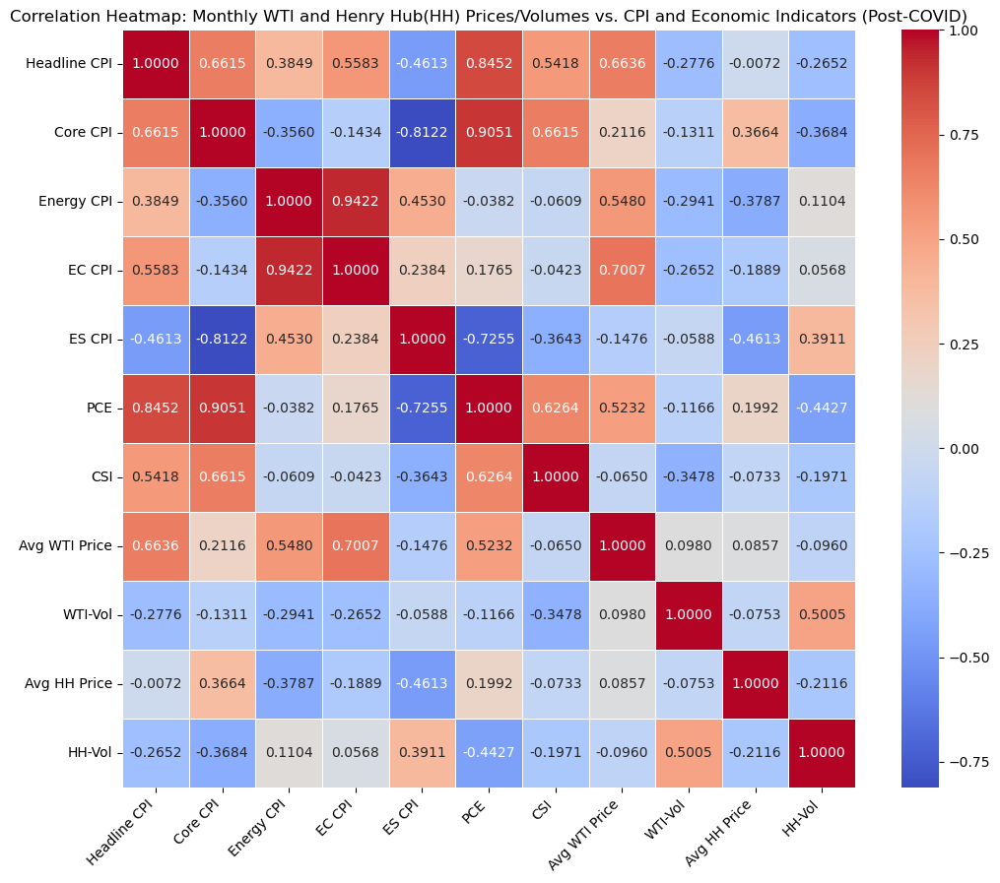

In [44]:
plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(corr_pcovid, annot=True,fmt=".4f", cmap='coolwarm', linewidths=0.5)

#EC: Energy Commodities
#ES: Energy Service
tick_labels = ["Headline CPI","Core CPI","Energy CPI", "EC CPI", "ES CPI", "PCE","CSI",
               "Avg WTI Price","WTI-Vol","Avg HH Price","HH-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Monthly WTI and Henry Hub(HH) Prices/Volumes vs. CPI and Economic Indicators (Post-COVID)')

plt.savefig('outputs/heatmap_hhWTI_CPI_pcovid.png')

plt.show()

In [45]:
comparison_matrix_pcovid = compare_correlation(corr_pcovid, corr_covid)
comparison_matrix_pcovid

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
CPI_all_items,Same,Low,Low,Low,Low,Low,High,Low,High,Low,High
CPI_excl_food_energy,Low,Same,Low,Low,Low,Low,High,Low,High,Low,High
CPI_Energy,Low,Low,Same,Low,Low,Low,Low,Low,Low,Low,High
CPI_Energy_Commo,Low,Low,Low,Same,Low,Low,Low,Low,Low,Low,High
CPI_Energy_Ser,Low,Low,Low,Low,Same,Low,Low,Low,High,Low,High
PCE,Low,Low,Low,Low,Low,Same,High,Low,High,Low,High
CSI,High,High,Low,Low,Low,High,Same,High,Low,High,Low
avg_price_wti,Low,Low,Low,Low,Low,Low,High,Same,High,Low,High
total_volume_wti,High,High,Low,Low,High,High,Low,High,Same,High,High
avg_price_ng,Low,Low,Low,Low,Low,Low,High,Low,High,Same,High


In [46]:
# Percentage Change in Correlation (Past Decade vs. COVID-19 Period)
percent_change_full_pcovid = correlation_change(corr_pcovid, corr_covid)
percent_change_full_pcovid

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,avg_price_wti,total_volume_wti,avg_price_ng,total_volume_ng
CPI_all_items,0.000000,-30.834023,-54.631608,-27.250190,-149.103254,-15.210254,912.703116,-30.050436,15.433868,-100.876058,55.740444
CPI_excl_food_energy,-30.834023,0.000000,-152.542231,-124.444632,-191.809553,-5.689381,5395.363992,-76.295303,61.874127,-48.860285,33.795269
CPI_Energy,-54.631608,-152.542231,0.000000,-4.487664,-39.648697,-104.538097,-1007.260787,-32.591548,-101.708443,-151.720429,121.402442
CPI_Energy_Commo,-27.250190,-124.444632,-4.487664,0.000000,-62.592282,-76.858438,-148.458624,-4.605244,-232.287933,-129.776684,112.280229
CPI_Energy_Ser,-149.103254,-191.809553,-39.648697,-62.592282,0.000000,-177.886897,-96.412837,-116.646483,85.226015,-152.204814,163.491814
PCE,-15.210254,-5.689381,-104.538097,-76.858438,-177.886897,0.000000,2015.991922,-44.933259,65.832332,-75.200542,26.336882
CSI,912.703116,5395.363992,-1007.260787,-148.458624,-96.412837,2015.991922,0.000000,45.773027,-778.543306,81.009194,-66.147899
avg_price_wti,-30.050436,-76.295303,-32.591548,-4.605244,-116.646483,-44.933259,45.773027,0.000000,122.388144,-89.231215,83.949866
total_volume_wti,15.433868,61.874127,-101.708443,-232.287933,85.226015,65.832332,-778.543306,122.388144,0.000000,77.278415,20.628619
avg_price_ng,-100.876058,-48.860285,-151.720429,-129.776684,-152.204814,-75.200542,81.009194,-89.231215,77.278415,0.000000,58.307873


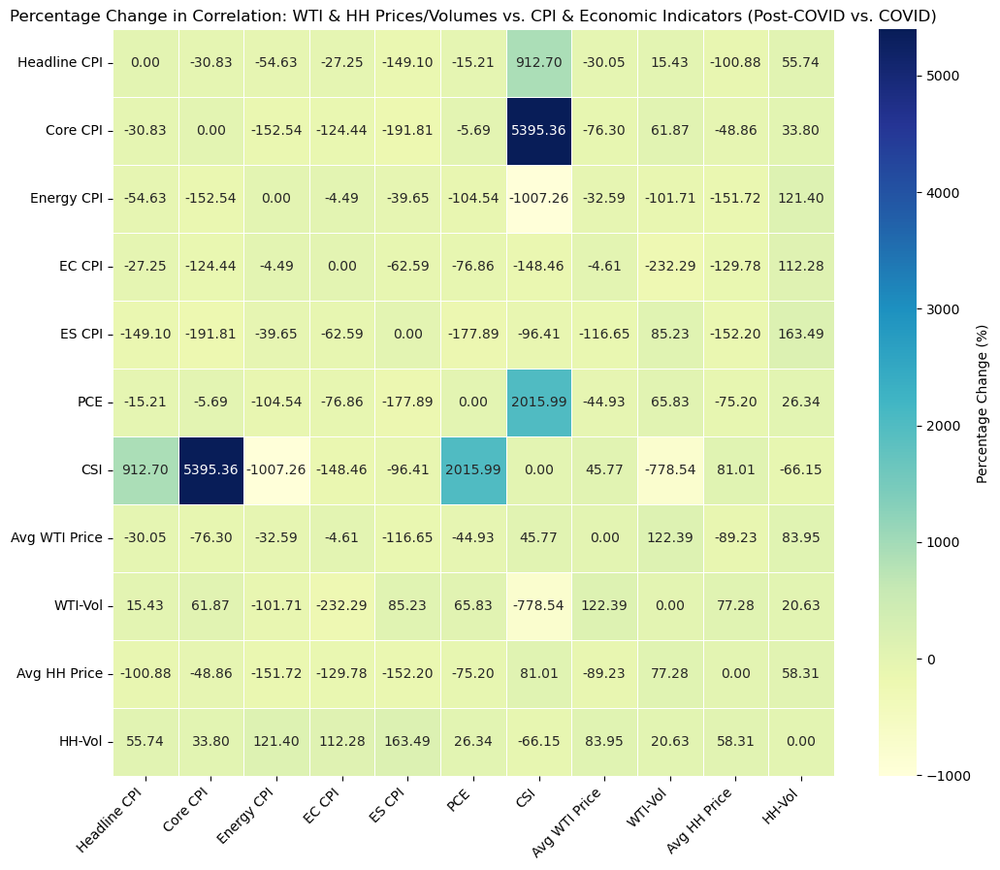

In [47]:
# Percentage Change in Correlation (Post-COVID vs. COVID)
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(percent_change_full_pcovid, annot=True,fmt=".2f",cmap='YlGnBu', linewidths=0.5,
                     cbar_kws={'label': 'Percentage Change (%)'})

#EC: Energy Commodities
#ES: Energy Service
tick_labels = ["Headline CPI","Core CPI","Energy CPI", "EC CPI", "ES CPI", "PCE","CSI",
               "Avg WTI Price","WTI-Vol","Avg HH Price","HH-Vol"]


heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Percentage Change in Correlation: WTI & HH Prices/Volumes vs. CPI & Economic Indicators (Post-COVID vs. COVID)')

plt.savefig('outputs/heatmap_changeinCorr_hhWTI_CPI_1yrs.png', dpi=300)

plt.show()

In [48]:
plot_comm_vs_cpi_spearman(
    comm_value='avg_price_wti', 
    comm_label='Avg Monthly WTI Futures Price',
    comm_unit = 'USD/Barrel',
    cpi_value='CPI_Energy_Ser', 
    cpi_label='Energy Service CPI',
    cpi_unit = 'YoY % Change',
    title_period ='From 2023-Jun to 2024-Nov',
    cpi_cop_alu_pcovid=monthly_full_pcovid, 
)


Quick Summary
--------------
The Spearman Rank Correlation between Avg Monthly WTI Futures Price and Energy Service CPI is: -0.148
The slope of the Avg Monthly WTI Futures Price trendline is: -0.012108
The slope of the Energy Service CPI trendline is: 0.014483


In [49]:
plot_comm_vs_cpi_spearman(
    comm_value='avg_price_ng', 
    comm_label='Avg Monthly Henry Hub Futures Price',
    comm_unit = 'USD/MMBtu',
    cpi_value='CPI_Energy_Ser', 
    cpi_label='Energy Service CPI',
    cpi_unit = 'YoY % Change',
    title_period ='From 2023-Jun to 2024-Nov',
    cpi_cop_alu_pcovid=monthly_full_pcovid, 
)

Quick Summary
--------------
The Spearman Rank Correlation between Avg Monthly Henry Hub Futures Price and Energy Service CPI is: -0.461
The slope of the Avg Monthly Henry Hub Futures Price trendline is: -0.000712
The slope of the Energy Service CPI trendline is: 0.014483


In [50]:
plot_comm_vs_cpi_spearman(
    comm_value='avg_price_ng', 
    comm_label='Avg Monthly Henry Hub Futures Price',
    comm_unit = 'USD/MMBtu',
    cpi_value='CPI_Energy_Commo', 
    cpi_label='Energy Commodities CPI',
    cpi_unit = 'YoY % Change',
    title_period ='From 2023-Jun to 2024-Nov',
    cpi_cop_alu_pcovid=monthly_full_pcovid, 
)

Quick Summary
--------------
The Spearman Rank Correlation between Avg Monthly Henry Hub Futures Price and Energy Commodities CPI is: -0.189
The slope of the Avg Monthly Henry Hub Futures Price trendline is: -0.000712
The slope of the Energy Commodities CPI trendline is: 0.010188


# 3. Cryptocurrencies
---
- **3.1 Cryptocurrencies and Hard Commodities (WTI Crude Oil/Henry Hub Natural Gas)**
    - Includes additional analysis on **gold**.
- **3.2 Seasonality**

## 3.1 Cyrptocurrencies v.s. WTI /Henry Hub
---
- **Heatmap Visualizations & Hypothesis Testing**
    - **3.1.1 Five-Year Period**: Dec 2019 – Nov 2024  
    - **3.1.2 COVID-19 Period**: Mar 2020 – May 2023  
    - **3.1.3 Post-COVID Period**: Jun 2023 – Nov 2024  

In [51]:
crypto_full_3yrs = pd.read_csv("outputs/crypto_2021Dec_2024Nov.csv")
crypto_full_3yrs.head()

,date,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
0,2021-12-01,57229.828125,36858195307,4586.990234,27634826695,56990.0,6552,4594.50,5468
1,2021-12-02,56477.816406,32379968686,4511.302246,21502671027,57175.0,5835,4543.25,5197
2,2021-12-03,53598.246094,39789134215,4220.706055,25879591528,53545.0,11175,4214.00,6550
3,2021-12-06,50582.625000,37707308001,4358.737305,28229518513,48960.0,9344,4206.50,4634
4,2021-12-07,50700.085938,33676814852,4315.061523,22366213354,50600.0,4985,4298.50,2832


In [52]:
crypto_full_3yrs = crypto_full_3yrs.rename(columns={'date': 'Date'})
crypto_full_3yrs.head()

,Date,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
0,2021-12-01,57229.828125,36858195307,4586.990234,27634826695,56990.0,6552,4594.50,5468
1,2021-12-02,56477.816406,32379968686,4511.302246,21502671027,57175.0,5835,4543.25,5197
2,2021-12-03,53598.246094,39789134215,4220.706055,25879591528,53545.0,11175,4214.00,6550
3,2021-12-06,50582.625000,37707308001,4358.737305,28229518513,48960.0,9344,4206.50,4634
4,2021-12-07,50700.085938,33676814852,4315.061523,22366213354,50600.0,4985,4298.50,2832


In [53]:
crypto_spot_5yr_df = pd.read_csv("outputs/crypto_2019Dec_2024Nov.csv")
crypto_spot_5yr_df.head()

,date,close_b,volume_b,close_eth,volume_eth
0,2019-12-01,7424.292480,18720708479,151.185730,7102780298
1,2019-12-02,7321.988281,17082040706,149.059158,6670561362
2,2019-12-03,7320.145508,14797485769,147.956421,6204379850
3,2019-12-04,7252.034668,21664240918,146.747742,7865937094
4,2019-12-05,7448.307617,18816085231,149.248993,6745910228


In [54]:
crypto_spot_5yr_df = crypto_spot_5yr_df.rename(columns={'date': 'Date'})
crypto_spot_5yr_df.head()

,Date,close_b,volume_b,close_eth,volume_eth
0,2019-12-01,7424.292480,18720708479,151.185730,7102780298
1,2019-12-02,7321.988281,17082040706,149.059158,6670561362
2,2019-12-03,7320.145508,14797485769,147.956421,6204379850
3,2019-12-04,7252.034668,21664240918,146.747742,7865937094
4,2019-12-05,7448.307617,18816085231,149.248993,6745910228


In [55]:
for df in [crypto_full_3yrs, crypto_spot_5yr_df]:
    df['Date'] = pd.to_datetime(df['Date'])

In [56]:
gold_daily = pd.read_csv("resources/gold_daily_f.csv")
gold_daily.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-12-01,1160.000000,1220.400024,1141.699951,1218.000000,1218.000000,5524
1,2014-12-02,1212.300049,1212.300049,1191.300049,1199.199951,1199.199951,1236
2,2014-12-03,1198.099976,1213.699951,1196.099976,1208.500000,1208.500000,440
3,2014-12-04,1208.199951,1213.000000,1201.599976,1207.500000,1207.500000,358
4,2014-12-05,1203.099976,1206.000000,1186.699951,1190.099976,1190.099976,560


In [57]:
gold_daily_df = gold_daily[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_gold', 'Volume': 'volume_gold'})
gold_daily_df['Date'] = pd.to_datetime(gold_daily_df['Date'])


In [58]:
comm_full.head()

,Date,close_wti,volume_wti,close_ng,volume_ng
0,2004-12-01,45.490002,146703.0,7.413,32354
1,2004-12-02,43.250000,158715.0,6.811,35709
2,2004-12-03,42.540001,109157.0,6.796,20993
3,2004-12-06,42.980000,82611.0,6.923,23903
4,2004-12-07,41.459999,109069.0,6.621,39556


In [59]:
comm_daily_df = pd.merge(comm_full,gold_daily_df, on='Date', how='right')
comm_daily_df.tail()

,Date,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold
2509,2024-11-22,71.239998,408207.0,3.129,95807,2709.899902,41
2510,2024-11-25,68.940002,380922.0,3.369,108485,2616.800049,94
2511,2024-11-26,68.769997,292138.0,3.431,222049,2620.300049,177858
2512,2024-11-27,68.720001,227215.0,3.204,214291,2639.899902,61653
2513,2024-11-29,68.000000,291408.0,3.363,163060,2657.000000,3861


In [60]:
comm_daily_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2514 entries, 0 to 2513
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         2514 non-null   datetime64[ns]
 1   close_wti    2514 non-null   float64       
 2   volume_wti   2514 non-null   float64       
 3   close_ng     2514 non-null   float64       
 4   volume_ng    2514 non-null   int64         
 5   close_gold   2514 non-null   float64       
 6   volume_gold  2514 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(2)
memory usage: 157.1 KB


### 3.1.1 Five-Year Period: Dec 2019 – Nov 2024  

In [61]:
comm_daily_df_5yr = comm_daily_df[(comm_daily_df['Date'] >= '2019-12-01')&
                                  (comm_daily_df['Date'] <= '2024-11-29')].reset_index(drop=True)

comm_crypto_df_5yr = pd.merge(comm_daily_df_5yr,crypto_spot_5yr_df, on='Date', how='left')
comm_crypto_df_5yr.tail()

,Date,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
1253,2024-11-22,71.239998,408207.0,3.129,95807,2709.899902,41,98997.664062,78473580551,3331.600830,36775716442
1254,2024-11-25,68.940002,380922.0,3.369,108485,2616.800049,94,93102.296875,80909462490,3413.543945,51544793988
1255,2024-11-26,68.769997,292138.0,3.431,222049,2620.300049,177858,91985.320312,91656519855,3326.517334,39902959158
1256,2024-11-27,68.720001,227215.0,3.204,214291,2639.899902,61653,95962.531250,71133452438,3657.249268,43383987191
1257,2024-11-29,68.000000,291408.0,3.363,163060,2657.000000,3861,97461.523438,54968682476,3593.494385,27622629486


In [62]:
corr_comm_crypto_5yr = comm_crypto_df_5yr.drop(columns=['Date']).corr()
corr_comm_crypto_5yr

,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_wti,1.000000,-0.305082,0.619661,-0.226266,0.193066,-0.011651,0.380822,-0.142533,0.566276,-0.044758
volume_wti,-0.305082,1.000000,-0.160791,0.214385,-0.261434,0.025978,-0.171693,0.097182,-0.181057,0.098915
close_ng,0.619661,-0.160791,1.000000,-0.240548,-0.263233,0.000170,-0.050774,-0.005819,0.186277,0.083886
volume_ng,-0.226266,0.214385,-0.240548,1.000000,0.061147,0.021460,-0.003097,0.032037,-0.077534,-0.018609
close_gold,0.193066,-0.261434,-0.263233,0.061147,1.000000,-0.002327,0.692472,0.044036,0.463479,0.057312
volume_gold,-0.011651,0.025978,0.000170,0.021460,-0.002327,1.000000,0.012403,0.003336,0.003154,0.009504
close_b,0.380822,-0.171693,-0.050774,-0.003097,0.692472,0.012403,1.000000,0.301565,0.869329,0.384970
volume_b,-0.142533,0.097182,-0.005819,0.032037,0.044036,0.003336,0.301565,1.000000,0.120308,0.786912
close_eth,0.566276,-0.181057,0.186277,-0.077534,0.463479,0.003154,0.869329,0.120308,1.000000,0.296513
volume_eth,-0.044758,0.098915,0.083886,-0.018609,0.057312,0.009504,0.384970,0.786912,0.296513,1.000000


In [63]:
# Correlation significance test: five-year period
correlations_comm_crypto_5yr = {'Gold(Futures) v.s. WTI': corr_comm_crypto_5yr.iloc[4,0],
                'Gold(Futures) v.s. HH': corr_comm_crypto_5yr.iloc[4,2],
               'Gold(Futures) v.s. HH-Vol': corr_comm_crypto_5yr.iloc[4,3],
               }

n = len(comm_crypto_df_5yr)

corr_statsig(correlations_comm_crypto_5yr, n)

Gold(Futures) v.s. WTI:
  Correlation (r): 0.1931
  t-statistic: 6.9735
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. HH:
  Correlation (r): -0.2632
  t-statistic: -9.6700
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. HH-Vol:
  Correlation (r): 0.0611
  t-statistic: 2.1711
  p-value: 0.0301
  Significant: Yes
--------------------------------------------------


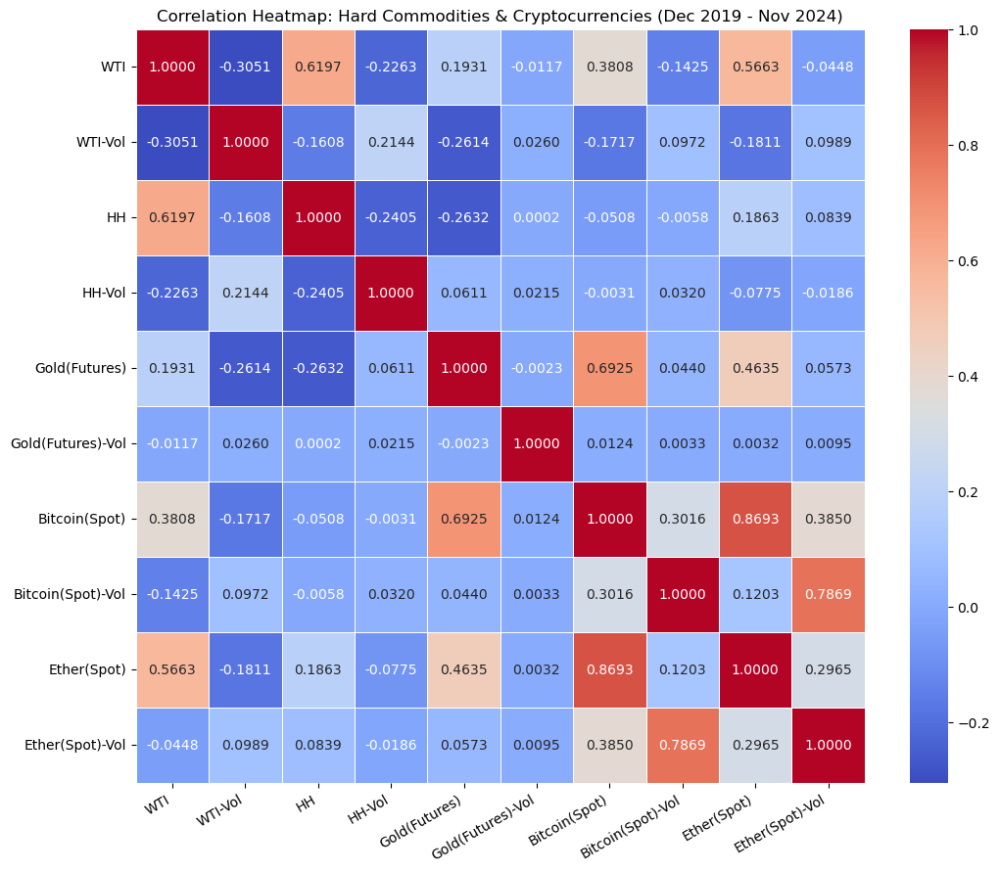

In [64]:
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(corr_comm_crypto_5yr, annot=True,fmt=".4f",cmap='coolwarm', linewidths=0.5)

tick_labels = ["WTI","WTI-Vol","HH","HH-Vol","Gold(Futures)", "Gold(Futures)-Vol",
                "Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=30,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Hard Commodities & Cryptocurrencies (Dec 2019 - Nov 2024)')

plt.savefig('outputs/heatmap_crypto_comm2_5yrs.png', dpi=300)

plt.show()


In [65]:
plot_comm_vs_factor(
    comm_value='close_ng', 
    comm_label='Henry Hub Futures Price',
    comm_unit = 'USD/MMBtu',
    factor_value='close_gold', 
    factor_label='Gold Spot Price',
    factor_unit = 'USD/Troy Oz',
    time_frame = 'From Dec-2019 to Nov-2024',
    factor_df=comm_crypto_df_5yr, 
    comm_df=comm_crypto_df_5yr
)

Quick Summary
--------------
The Pearson correlation between Henry Hub Futures Price and Gold Spot Price is: -0.263
The slope of the Henry Hub Futures Price trendline is: 0.000101
The slope of the Gold Spot Price trendline is: 0.370557


In [66]:
plot_comm_vs_factor(
    comm_value='close_wti', 
    comm_label='WTI Futures Price',
    comm_unit = 'USD/Barrel',
    factor_value='close_gold', 
    factor_label='Gold Spot Price',
    factor_unit = 'USD/Troy Oz',
    time_frame = 'From Dec-2019 to Nov-2024',
    factor_df=comm_crypto_df_5yr, 
    comm_df=comm_crypto_df_5yr
)

Quick Summary
--------------
The Pearson correlation between WTI Futures Price and Gold Spot Price is: 0.193
The slope of the WTI Futures Price trendline is: 0.022375
The slope of the Gold Spot Price trendline is: 0.370557


In [68]:
plot_comm_vs_factor(
    comm_value='close_wti', 
    comm_label='WTI Futures Price',
    comm_unit = 'USD/Barrel',
    factor_value='close_b', 
    factor_label='Bitcoin Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Dec-2019 to Nov-2024',
    factor_df=comm_crypto_df_5yr, 
    comm_df=comm_crypto_df_5yr
)

Quick Summary
--------------
The Pearson correlation between WTI Futures Price and Bitcoin Spot Price is: 0.381
The slope of the WTI Futures Price trendline is: 0.022375
The slope of the Bitcoin Spot Price trendline is: 23.021805


In [69]:
plot_comm_vs_factor(
    comm_value='close_ng', 
    comm_label='Henry Hub Futures Price',
    comm_unit = 'USD/MMBtu',
    factor_value='close_b', 
    factor_label='Bitcoin Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Dec-2019 to Nov-2024',
    factor_df=comm_crypto_df_5yr, 
    comm_df=comm_crypto_df_5yr
)

Quick Summary
--------------
The Pearson correlation between Henry Hub Futures Price and Bitcoin Spot Price is: -0.051
The slope of the Henry Hub Futures Price trendline is: 0.000101
The slope of the Bitcoin Spot Price trendline is: 23.021805


### 3.1.2 COVID-19 Period: Mar 2020 – May 2023  

In [70]:
start_date = '2020-03-01'
end_date = '2023-05-31'

comm_crypto_df_covid = pd.merge(comm_daily_df[(comm_daily_df['Date'] >= start_date) & (comm_daily_df['Date'] <= end_date)], 
        crypto_spot_5yr_df[(crypto_spot_5yr_df['Date'] >= start_date) & (crypto_spot_5yr_df['Date'] <= end_date)], 
        on='Date', how='left')

comm_crypto_df_covid.tail()


,Date,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
814,2023-05-24,74.339996,386611.0,2.398,33040,1962.800049,189,26334.818359,16299104428,1800.099976,7101647419
815,2023-05-25,71.830002,422637.0,2.307,48663,1943.099976,1,26476.207031,13851122697,1805.953735,6321689859
816,2023-05-26,72.669998,261498.0,2.181,140560,1944.099976,166036,26719.291016,12711619225,1828.689697,5451414258
817,2023-05-30,69.459999,440862.0,2.327,183534,1958.000000,37838,27702.349609,13251081851,1901.026611,5363439784
818,2023-05-31,68.089996,444787.0,2.266,151831,1963.900024,5959,27219.658203,15656371534,1874.130493,5984512548


In [71]:
corr_comm_crypto_covid = comm_crypto_df_covid.drop(columns=['Date']).corr()
corr_comm_crypto_covid

,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_wti,1.000000,-0.270819,0.772912,-0.266789,0.160974,-0.007612,0.423237,-0.123014,0.579460,0.000012
volume_wti,-0.270819,1.000000,-0.216369,0.235010,-0.238894,0.030260,0.003694,0.134144,-0.036059,0.140719
close_ng,0.772912,-0.216369,1.000000,-0.219145,-0.174905,0.001412,0.174292,-0.068483,0.353339,0.022250
volume_ng,-0.266789,0.235010,-0.219145,1.000000,0.001609,0.015052,-0.106414,-0.000314,-0.106827,-0.035779
close_gold,0.160974,-0.238894,-0.174905,0.001609,1.000000,0.008763,0.076254,-0.233288,0.123226,-0.118131
volume_gold,-0.007612,0.030260,0.001412,0.015052,0.008763,1.000000,0.000634,-0.011588,-0.006122,0.002121
close_b,0.423237,0.003694,0.174292,-0.106414,0.076254,0.000634,1.000000,0.281753,0.883918,0.458543
volume_b,-0.123014,0.134144,-0.068483,-0.000314,-0.233288,-0.011588,0.281753,1.000000,0.055851,0.719196
close_eth,0.579460,-0.036059,0.353339,-0.106827,0.123226,-0.006122,0.883918,0.055851,1.000000,0.303536
volume_eth,0.000012,0.140719,0.022250,-0.035779,-0.118131,0.002121,0.458543,0.719196,0.303536,1.000000


In [72]:
# Correlation significance test: COVID-19 period
correlations_comm_crypto_covid = {'Gold(Futures) v.s. WTI': corr_comm_crypto_covid.iloc[4,0],
                'Gold(Futures) v.s. HH': corr_comm_crypto_covid.iloc[4,2],
               'HH v.s. Bitcoin(Spot)': corr_comm_crypto_covid.iloc[2,6],
                'WTIv.s. Bitcoin(Spot)': corr_comm_crypto_covid.iloc[0,6],
               }

n = len(comm_crypto_df_covid)

corr_statsig(correlations_comm_crypto_covid, n)

Gold(Futures) v.s. WTI:
  Correlation (r): 0.1610
  t-statistic: 4.6620
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. HH:
  Correlation (r): -0.1749
  t-statistic: -5.0776
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
HH v.s. Bitcoin(Spot):
  Correlation (r): 0.1743
  t-statistic: 5.0593
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
WTIv.s. Bitcoin(Spot):
  Correlation (r): 0.4232
  t-statistic: 13.3523
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------


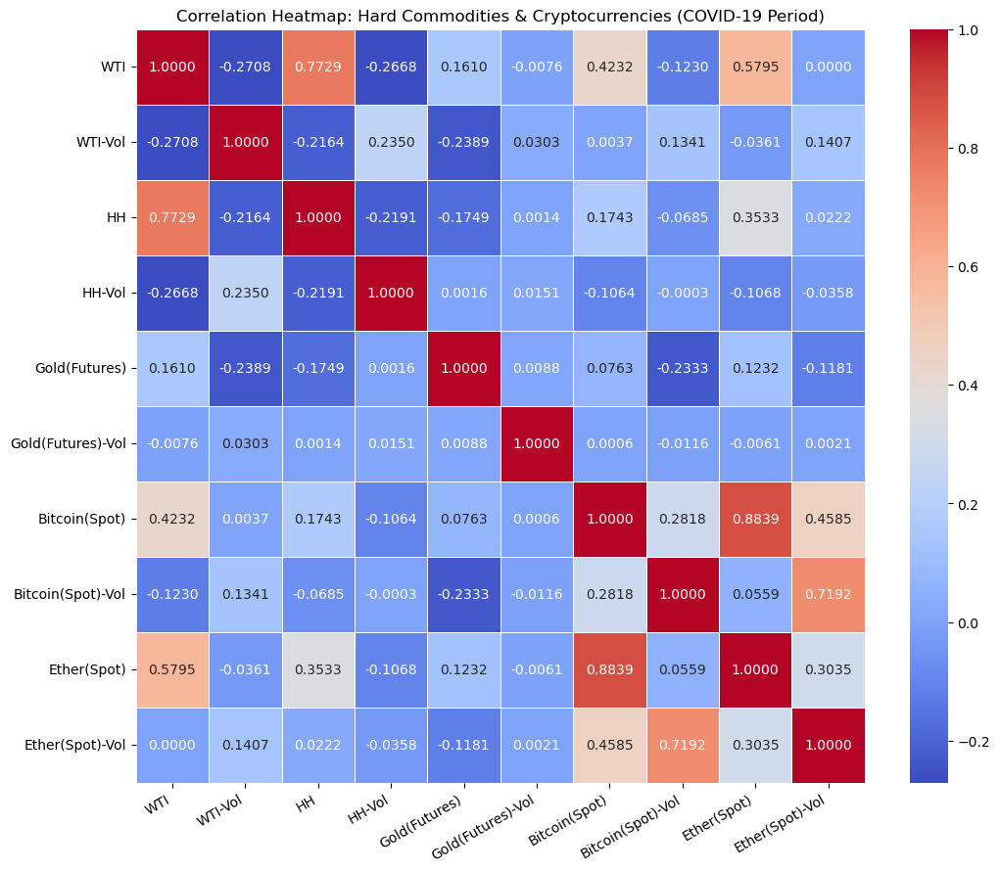

In [73]:
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(corr_comm_crypto_covid, annot=True,fmt=".4f",cmap='coolwarm', linewidths=0.5)

tick_labels = ["WTI","WTI-Vol","HH","HH-Vol","Gold(Futures)", "Gold(Futures)-Vol",
                "Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=30,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Hard Commodities & Cryptocurrencies (COVID-19 Period)')

plt.savefig('outputs/heatmap_crypto_comm2_covid.png', dpi=300)

plt.show()

In [74]:
# Calculate the correlation difference
# dataframe 1 = corr_comm_crypto_covid: Mar 2020 ~ May 2023
# dataframe 2 = corr_comm_crypto_5yr: Nov 2019 ~ Nov 2024
comparison_matrix_commCrypto1 = compare_correlation(corr_comm_crypto_covid, corr_comm_crypto_5yr)
comparison_matrix_commCrypto1

,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_wti,Same,High,High,Low,Low,High,High,High,High,High
volume_wti,High,Same,Low,High,High,High,High,High,High,High
close_ng,High,Low,Same,High,High,High,High,Low,High,Low
volume_ng,Low,High,High,Same,Low,Low,Low,Low,Low,Low
close_gold,Low,High,High,Low,Same,High,Low,Low,Low,Low
volume_gold,High,High,High,Low,High,Same,Low,Low,Low,Low
close_b,High,High,High,Low,Low,Low,Same,Low,High,High
volume_b,High,High,Low,Low,Low,Low,Low,Same,Low,Low
close_eth,High,High,High,Low,Low,Low,High,Low,Same,High
volume_eth,High,High,Low,Low,Low,Low,High,Low,High,Same


In [75]:
# Percentage Change in Correlation (Past Five Years vs. COVID-19 Period)
percent_change1= correlation_change(corr_comm_crypto_covid, corr_comm_crypto_5yr)
percent_change1

,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_wti,0.000000,11.230806,24.731468,-17.909648,-16.622369,34.668962,11.137707,13.694672,2.328312,100.026052
volume_wti,11.230806,0.000000,-34.565407,9.620719,8.621555,16.481359,102.151625,38.033578,80.083874,42.262169
close_ng,24.731468,-34.565407,0.000000,8.897452,33.554993,730.778612,443.270293,-1076.995118,89.684327,-73.476255
volume_ng,-17.909648,9.620719,8.897452,0.000000,-97.368322,-29.859692,-3336.560126,-100.981136,-37.780974,-92.272084
close_gold,-16.622369,8.621555,33.554993,-97.368322,0.000000,476.505688,-88.988130,-629.763694,-73.412799,-306.121026
volume_gold,34.668962,16.481359,730.778612,-29.859692,476.505688,0.000000,-94.891160,-447.346524,-294.075780,-77.684459
close_b,11.137707,102.151625,443.270293,-3336.560126,-88.988130,-94.891160,0.000000,-6.569973,1.678143,19.111264
volume_b,13.694672,38.033578,-1076.995118,-100.981136,-629.763694,-447.346524,-6.569973,0.000000,-53.576728,-8.605245
close_eth,2.328312,80.083874,89.684327,-37.780974,-73.412799,-294.075780,1.678143,-53.576728,0.000000,2.368722
volume_eth,100.026052,42.262169,-73.476255,-92.272084,-306.121026,-77.684459,19.111264,-8.605245,2.368722,0.000000


In [76]:
plot_comm_vs_factor(
    comm_value='close_ng', 
    comm_label='Henry Hub Futures Price',
    comm_unit = 'USD/MMBtu',
    factor_value='close_gold', 
    factor_label='Gold Spot Price',
    factor_unit = 'USD/Troy Oz',
    time_frame = 'From Mar-2020 to May-2023',
    factor_df=comm_crypto_df_covid, 
    comm_df=comm_crypto_df_covid
)


Quick Summary
--------------
The Pearson correlation between Henry Hub Futures Price and Gold Spot Price is: -0.175
The slope of the Henry Hub Futures Price trendline is: 0.003235
The slope of the Gold Spot Price trendline is: 0.066753


In [77]:
plot_comm_vs_factor(
    comm_value='close_wti', 
    comm_label='WTI Futures Price',
    comm_unit = 'USD/Barrel',
    factor_value='close_gold', 
    factor_label='Gold Spot Price',
    factor_unit = 'USD/Troy Oz',
    time_frame = 'From Mar-2020 to May-2023',
    factor_df=comm_crypto_df_covid, 
    comm_df=comm_crypto_df_covid
)

Quick Summary
--------------
The Pearson correlation between WTI Futures Price and Gold Spot Price is: 0.161
The slope of the WTI Futures Price trendline is: 0.054381
The slope of the Gold Spot Price trendline is: 0.066753


In [78]:
plot_comm_vs_factor(
    comm_value='close_ng', 
    comm_label='Henry Hub Futures Price',
    comm_unit = 'USD/MMBtu',
    factor_value='close_b', 
    factor_label='Bitcoin Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Mar-2020 to May-2023',
    factor_df=comm_crypto_df_covid, 
    comm_df=comm_crypto_df_covid
)

Quick Summary
--------------
The Pearson correlation between Henry Hub Futures Price and Bitcoin Spot Price is: 0.174
The slope of the Henry Hub Futures Price trendline is: 0.003235
The slope of the Bitcoin Spot Price trendline is: 8.401279


In [79]:
plot_comm_vs_factor(
    comm_value='close_wti', 
    comm_label='WTI Futures Price',
    comm_unit = 'USD/Barrel',
    factor_value='close_eth', 
    factor_label='Ether Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Mar-2020 to May-2023',
    factor_df=comm_crypto_df_covid, 
    comm_df=comm_crypto_df_covid
)

Quick Summary
--------------
The Pearson correlation between WTI Futures Price and Ether Spot Price is: 0.579
The slope of the WTI Futures Price trendline is: 0.054381
The slope of the Ether Spot Price trendline is: 1.338582


### 3.1.3 Post-COVID Period: Jun 2023 – Nov 2024  

In [80]:
start_date = '2023-06-01'
end_date = '2024-11-30'


comm_crypto_df_pcovid = pd.merge(comm_daily_df[(comm_daily_df['Date'] >= start_date) & (comm_daily_df['Date'] <= end_date)], 
        crypto_spot_5yr_df[(crypto_spot_5yr_df['Date'] >= start_date) & (crypto_spot_5yr_df['Date'] <= end_date)], 
        on='Date', how='left')

comm_crypto_df_pcovid.tail()

,Date,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
373,2024-11-22,71.239998,408207.0,3.129,95807,2709.899902,41,98997.664062,78473580551,3331.600830,36775716442
374,2024-11-25,68.940002,380922.0,3.369,108485,2616.800049,94,93102.296875,80909462490,3413.543945,51544793988
375,2024-11-26,68.769997,292138.0,3.431,222049,2620.300049,177858,91985.320312,91656519855,3326.517334,39902959158
376,2024-11-27,68.720001,227215.0,3.204,214291,2639.899902,61653,95962.531250,71133452438,3657.249268,43383987191
377,2024-11-29,68.000000,291408.0,3.363,163060,2657.000000,3861,97461.523438,54968682476,3593.494385,27622629486


In [81]:
corr_comm_crypto_pcovid = comm_crypto_df_pcovid.drop(columns=['Date']).corr()
corr_comm_crypto_pcovid

,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_wti,1.000000,-0.041517,-0.058451,-0.181027,-0.393025,-0.012016,-0.281819,-0.315932,-0.066596,-0.310331
volume_wti,-0.041517,1.000000,0.046144,0.045011,-0.015209,-0.009650,-0.073714,-0.033591,-0.075109,-0.024213
close_ng,-0.058451,0.046144,1.000000,0.063866,-0.172638,-0.008045,-0.294944,-0.162187,-0.446479,-0.149323
volume_ng,-0.181027,0.045011,0.063866,1.000000,0.145486,0.052632,0.200808,0.222087,0.153420,0.173455
close_gold,-0.393025,-0.015209,-0.172638,0.145486,1.000000,0.010545,0.853687,0.551393,0.582794,0.572758
volume_gold,-0.012016,-0.009650,-0.008045,0.052632,0.010545,1.000000,0.070956,0.037152,0.077509,0.037963
close_b,-0.281819,-0.073714,-0.294944,0.200808,0.853687,0.070956,1.000000,0.732682,0.873198,0.749052
volume_b,-0.315932,-0.033591,-0.162187,0.222087,0.551393,0.037152,0.732682,1.000000,0.577993,0.939606
close_eth,-0.066596,-0.075109,-0.446479,0.153420,0.582794,0.077509,0.873198,0.577993,1.000000,0.632096
volume_eth,-0.310331,-0.024213,-0.149323,0.173455,0.572758,0.037963,0.749052,0.939606,0.632096,1.000000


In [82]:
# Correlation significance test: Post-COVID period
correlations_comm_crypto_pcovid = {'Gold(Futures) v.s. WTI': corr_comm_crypto_pcovid.iloc[4,0],
                'Gold(Futures) v.s. HH': corr_comm_crypto_pcovid.iloc[4,2],
                'Bitcoin(Spot) v.s. WTI': corr_comm_crypto_pcovid.iloc[6,0],
                'Bitcoin(Spot) v.s. HH': corr_comm_crypto_pcovid.iloc[6,2],
                                   
               }

n = len(corr_comm_crypto_pcovid)

corr_statsig(correlations_comm_crypto_pcovid, n)

Gold(Futures) v.s. WTI:
  Correlation (r): -0.3930
  t-statistic: -1.2089
  p-value: 0.2612
  Significant: No
--------------------------------------------------
Gold(Futures) v.s. HH:
  Correlation (r): -0.1726
  t-statistic: -0.4957
  p-value: 0.6334
  Significant: No
--------------------------------------------------
Bitcoin(Spot) v.s. WTI:
  Correlation (r): -0.2818
  t-statistic: -0.8308
  p-value: 0.4302
  Significant: No
--------------------------------------------------
Bitcoin(Spot) v.s. HH:
  Correlation (r): -0.2949
  t-statistic: -0.8731
  p-value: 0.4081
  Significant: No
--------------------------------------------------


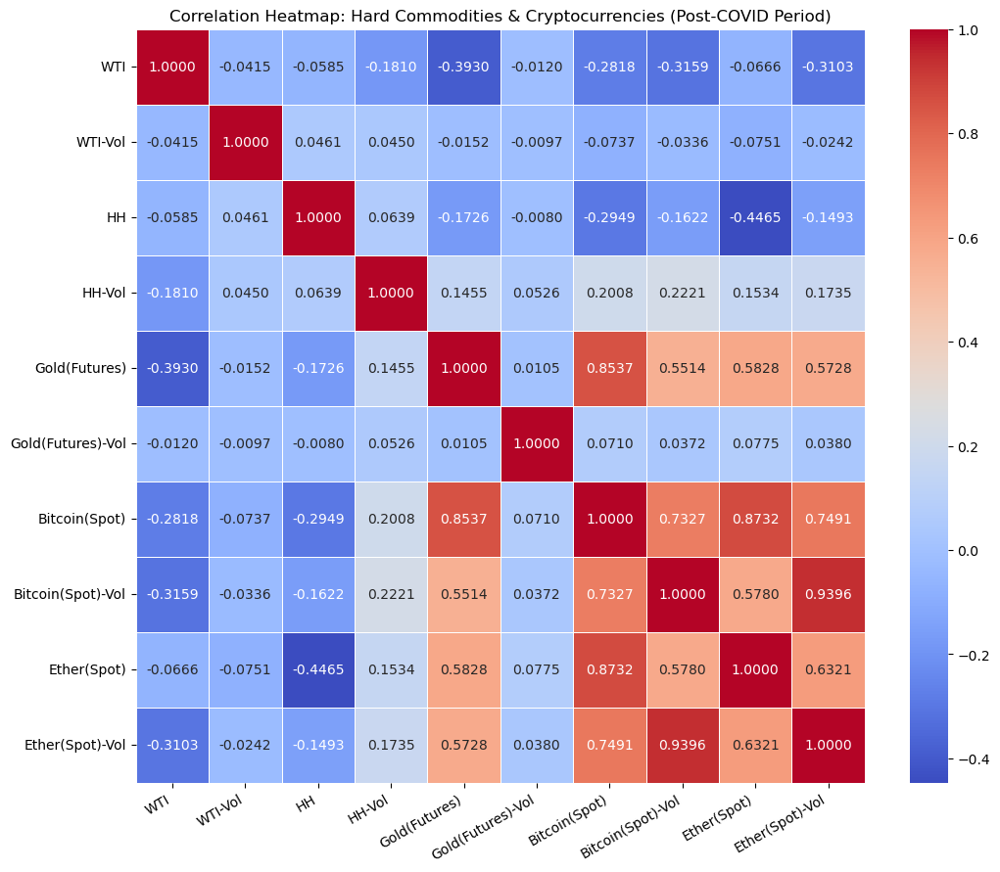

In [83]:
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(corr_comm_crypto_pcovid, annot=True,fmt=".4f",cmap='coolwarm', linewidths=0.5)

tick_labels = ["WTI","WTI-Vol","HH","HH-Vol","Gold(Futures)", "Gold(Futures)-Vol",
                "Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=30,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Hard Commodities & Cryptocurrencies (Post-COVID Period)')

plt.savefig('outputs/heatmap_crypto_comm2_postCovid.png', dpi=300)

plt.show()

In [84]:
# Calculate the correlation difference
# dataframe 1 = corr_comm_crypto_pcovid: Jun 2023 ~ Nov 2024
# dataframe 2 = corr_comm_crypto_covid: Mar 2020 ~ May 2023
comparison_matrix_commCrypto2 = compare_correlation(corr_comm_crypto_pcovid, corr_comm_crypto_covid)
comparison_matrix_commCrypto2

,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_wti,Same,High,Low,High,Low,Low,Low,Low,Low,Low
volume_wti,High,Same,High,Low,High,Low,Low,Low,Low,Low
close_ng,Low,High,Same,High,High,Low,Low,Low,Low,Low
volume_ng,High,Low,High,Same,High,High,High,High,High,High
close_gold,Low,High,High,High,Same,High,High,High,High,High
volume_gold,Low,Low,Low,High,High,Same,High,High,High,High
close_b,Low,Low,Low,High,High,High,Same,High,Low,High
volume_b,Low,Low,Low,High,High,High,High,Same,High,High
close_eth,Low,Low,Low,High,High,High,Low,High,Same,High
volume_eth,Low,Low,Low,High,High,High,High,High,High,Same


In [85]:
plot_comm_vs_factor(
    comm_value='close_ng', 
    comm_label='Henry Hub Futures Price',
    comm_unit = 'USD/MMBtu',
    factor_value='close_gold', 
    factor_label='Gold Spot Price',
    factor_unit = 'USD/Troy Oz',
    time_frame = 'From Jun-2023 to Nov-2024',
    factor_df=comm_crypto_df_pcovid, 
    comm_df=comm_crypto_df_pcovid
)

Quick Summary
--------------
The Pearson correlation between Henry Hub Futures Price and Gold Spot Price is: -0.173
The slope of the Henry Hub Futures Price trendline is: -0.000563
The slope of the Gold Spot Price trendline is: 1.600106


In [86]:
plot_comm_vs_factor(
    comm_value='close_wti', 
    comm_label='WTI Futures Price',
    comm_unit = 'USD/Barrel',
    factor_value='close_gold', 
    factor_label='Gold Spot Price',
    factor_unit = 'USD/Troy Oz',
    time_frame = 'From Jun-2023 to Nov-2024',
    factor_df=comm_crypto_df_pcovid, 
    comm_df=comm_crypto_df_pcovid
)

Quick Summary
--------------
The Pearson correlation between WTI Futures Price and Gold Spot Price is: -0.393
The slope of the WTI Futures Price trendline is: -0.011986
The slope of the Gold Spot Price trendline is: 1.600106


In [87]:
plot_comm_vs_factor(
    comm_value='close_ng', 
    comm_label='Henry Hub Futures Price',
    comm_unit = 'USD/MMBtu',
    factor_value='close_b', 
    factor_label='Bitcoin Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Jun-2023 to Nov-2024',
    factor_df=comm_crypto_df_pcovid, 
    comm_df=comm_crypto_df_pcovid
)

Quick Summary
--------------
The Pearson correlation between Henry Hub Futures Price and Bitcoin Spot Price is: -0.295
The slope of the Henry Hub Futures Price trendline is: -0.000563
The slope of the Bitcoin Spot Price trendline is: 102.009525


In [88]:
plot_comm_vs_factor(
    comm_value='close_wti', 
    comm_label='WTI Futures Price',
    comm_unit = 'USD/Barrel',
    factor_value='close_b', 
    factor_label='Bitcoin Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Jun-2023 to Nov-2024',
    factor_df=comm_crypto_df_pcovid, 
    comm_df=comm_crypto_df_pcovid
)

Quick Summary
--------------
The Pearson correlation between WTI Futures Price and Bitcoin Spot Price is: -0.282
The slope of the WTI Futures Price trendline is: -0.011986
The slope of the Bitcoin Spot Price trendline is: 102.009525


## 3.2 Seasonality 
---
- Analysis Focus:
    - **Period**: December 2021 to November 2024
    - **Metrics Analyzed**:
        1. Average Monthly Values- 
        2. Month-over-Month (MoM) Changes

In [89]:
def plot_dual_y_axis(df, years, x_column, primary_y_columns, secondary_y_columns, 
                     primary_y_label, secondary_y_label, title, legend_labels=None):


    filtered_df = df[df['Year'].isin(years)]

    fig = go.Figure()
    
    if legend_labels is None:
        legend_labels = primary_y_columns + secondary_y_columns
    elif len(legend_labels) != len(primary_y_columns) + len(secondary_y_columns):
        raise ValueError("The number of legend_labels must match the total number of columns.")
    
    
    for column, label in zip(primary_y_columns, legend_labels[:len(primary_y_columns)]):
        fig.add_trace(go.Scatter(
            x=filtered_df[x_column],
            y=filtered_df[column],
            mode='lines',
            name=label,
            yaxis='y1'
        ))
    

    for column, label in zip(secondary_y_columns, legend_labels[len(primary_y_columns):]):
        fig.add_trace(go.Scatter(
            x=filtered_df[x_column],
            y=filtered_df[column],
            mode='lines',
            name=label,
            yaxis='y2'
        ))
    

    fig.update_layout(
        title=f"{title}",
        xaxis=dict(title=x_column),
        yaxis=dict(
            title=primary_y_label,
            showgrid=True,
            zeroline=False,
        ),
        yaxis2=dict(
            title=secondary_y_label,
            overlaying='y',
            side='right',
            showgrid=False,
        ),
        legend=dict(x=1.1, y=1),
        template='plotly_white'
    )
    

    fig.show()
    
    return fig

In [90]:
comm_daily_df_3yr = comm_daily_df[(comm_daily_df['Date'] >= '2021-12-01')&
                                  (comm_daily_df['Date'] <= '2024-11-29')].reset_index(drop=True)

comm_crypto_df_3yr = pd.merge(comm_daily_df_3yr,crypto_full_3yrs, on='Date', how='left')
comm_crypto_df_3yr.head()

,Date,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
0,2021-12-01,65.570000,602447.0,4.258,171938,1781.599976,1128,57229.828125,36858195307,4586.990234,27634826695,56990.0,6552,4594.50,5468
1,2021-12-02,66.500000,668293.0,4.056,145506,1760.699951,1557,56477.816406,32379968686,4511.302246,21502671027,57175.0,5835,4543.25,5197
2,2021-12-03,66.260002,449974.0,4.132,124765,1782.000000,694,53598.246094,39789134215,4220.706055,25879591528,53545.0,11175,4214.00,6550
3,2021-12-06,69.489998,401060.0,3.657,176715,1777.500000,381,50582.625000,37707308001,4358.737305,28229518513,48960.0,9344,4206.50,4634
4,2021-12-07,72.050003,496528.0,3.708,162973,1782.599976,308,50700.085938,33676814852,4315.061523,22366213354,50600.0,4985,4298.50,2832


In [91]:
copied_season_df = comm_crypto_df_3yr.copy()

In [92]:
copied_season_df['Year'] = pd.to_datetime(copied_season_df['Date']).dt.year
copied_season_df['Month'] = pd.to_datetime(copied_season_df['Date']).dt.month
copied_season_df.head()

,Date,close_wti,volume_wti,close_ng,volume_ng,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f,Year,Month
0,2021-12-01,65.570000,602447.0,4.258,171938,1781.599976,1128,57229.828125,36858195307,4586.990234,27634826695,56990.0,6552,4594.50,5468,2021,12
1,2021-12-02,66.500000,668293.0,4.056,145506,1760.699951,1557,56477.816406,32379968686,4511.302246,21502671027,57175.0,5835,4543.25,5197,2021,12
2,2021-12-03,66.260002,449974.0,4.132,124765,1782.000000,694,53598.246094,39789134215,4220.706055,25879591528,53545.0,11175,4214.00,6550,2021,12
3,2021-12-06,69.489998,401060.0,3.657,176715,1777.500000,381,50582.625000,37707308001,4358.737305,28229518513,48960.0,9344,4206.50,4634,2021,12
4,2021-12-07,72.050003,496528.0,3.708,162973,1782.599976,308,50700.085938,33676814852,4315.061523,22366213354,50600.0,4985,4298.50,2832,2021,12


In [93]:
# Commodities: Daily Close Prices - 2024 (Jan-Nov)
fig = plot_dual_y_axis(
    df=copied_season_df,
    years = [2024],
    x_column='Date',
    # primary_y_columns=['close_wti'],
    primary_y_columns=['close_ng'],
    secondary_y_columns=['close_gold'],
    # primary_y_label='WTI Crude Oil Prices (USD/Barrel)',
    primary_y_label='Henry Hub Natural Gas Prices (USD/MMBtu)',
    secondary_y_label='Gold Prices (USD/Troy Ounce)',
    # title='WTI Crude Oil and Gold Futures Close Prices (Jan 2024 - Nov 2024)',
    title='Henry Hub Natural Gas and Gold Futures Close Prices (Jan 2024 - Nov 2024)',
    # legend_labels=['WTI','Gold']
    legend_labels=['HH Natural Gas','Gold']
)

In [94]:
def calculate_MoM_change(target_columns, df, agg_function):

    if not all(col in df.columns for col in target_columns):
        raise ValueError("One or more target columns are not in the DataFrame")
    
    if not hasattr(pd.core.groupby.DataFrameGroupBy, agg_function):
        raise ValueError(f"Invalid aggregation function: '{agg_function}'")
        
    seasonal_df = df.groupby(['Year', 'Month'])[target_columns].agg(agg_function).reset_index()
    
    for column in target_columns:
        seasonal_df[f'{column}_MoM'] = seasonal_df[column].pct_change(periods=1) * 100

    return seasonal_df

In [95]:
def plot_monthly_values(variables, seasonal_df, year,title_name,legend_labels=None):


    filtered_df = seasonal_df[seasonal_df['Year'] == year]
    
    if legend_labels is None:
        legend_labels = variables
    elif len(legend_labels) != len(variables):
        raise ValueError("The number of legend_labels must match the number of target_columns.")
    

    fig = go.Figure()
    
    for column, legend_label in zip(variables, legend_labels):
        fig.add_trace(go.Scatter(
            x=filtered_df['Month'],
            y=filtered_df[column],
            mode='lines+markers',
            name=legend_label
        ))
    
    fig.update_layout(
        title=f"Average Monthly Value of {title_name}",
        xaxis=dict(
            title='Month',
            tickmode='linear',
            tick0=1,
            dtick=1
        ),
        yaxis_title='Average Monthly Close Price($)',
        template='plotly_white'
    )
    
    fig.show()

In [96]:
def plot_MoM_pct_change(variables, seasonal_df, year,title_name,legend_labels=None):


    filtered_df = seasonal_df[seasonal_df['Year'] == year]
    
    if legend_labels is None:
        legend_labels = variables
    elif len(legend_labels) != len(variables):
        raise ValueError("The number of legend_labels must match the number of target_columns.")
    

    fig = go.Figure()
    
    for column, legend_label in zip(variables, legend_labels):
        fig.add_trace(go.Scatter(
            x=filtered_df['Month'],
            y=filtered_df[column],
            mode='lines+markers',
            name=legend_label
        ))
    
    fig.update_layout(
        title=f"Month-over-Month (MoM) Percentage Change in {title_name}",
        xaxis=dict(
            title='Month',
            tickmode='linear',
            tick0=1,
            dtick=1
        ),
        yaxis_title='MoM Percentage Change',
        template='plotly_white'
    )
    
    fig.show()

In [97]:
# Commodities MoM percentage change
target_columns = ['close_wti', 'close_ng', 'close_gold']
seasonal_comm = calculate_MoM_change(target_columns, copied_season_df, 'mean')
seasonal_comm.head()

,Year,Month,close_wti,close_ng,close_gold,close_wti_MoM,close_ng_MoM,close_gold_MoM
0,2021,12,71.690001,3.863818,1791.045443,NaN,NaN,NaN
1,2022,1,82.979000,4.255450,1816.639996,15.746965,10.135876,1.429029
2,2022,2,91.628947,4.463000,1857.742091,10.424260,4.877276,2.262534
3,2022,3,108.262174,4.979304,1950.673902,18.152808,11.568548,5.002407
4,2022,4,101.640499,6.704600,1933.930005,-6.116332,34.649332,-0.858365


In [98]:
# Commodities: Average Monthly Futures Prices - 2024 (Jan-Nov)
fig = plot_dual_y_axis(
    df=seasonal_comm,
    years = [2024],
    x_column='Month',
    # primary_y_columns=['close_wti'],
    primary_y_columns=['close_ng'],
    secondary_y_columns=['close_gold'],
    # primary_y_label='WTI Crude Oil Prices (USD/Barrel)',
    primary_y_label='Henry Hub Natural Gas Prices (USD/MMBtu)',
    secondary_y_label='Gold Prices (USD/Per Troy Ounce)',
    # title='WTI Crude Oil and Gold Monthly Futures Close Prices (Jan 2024 - Nov 2024)',
    title='Henry Hub Natural Gas and Gold Monthly Futures Close Prices (Jan 2024 - Nov 2024)',
    # legend_labels=['WTI', 'Gold'],
    legend_labels=['HH', 'Gold'],
)


In [99]:
# Commodities: Average Monthly Futures Prices - 2024 (Jan-Nov)
fig = plot_dual_y_axis(
    df=seasonal_comm,
    years = [2024],
    x_column='Month',
    primary_y_columns=['close_wti'],
    secondary_y_columns=['close_gold'],
    primary_y_label='WTI Crude Oil Prices (USD/Barrel)',
    secondary_y_label='Gold Prices (USD/Per Troy Ounce)',
    title='WTI Crude Oil and Gold Monthly Futures Close Prices (Jan 2024 - Nov 2024)',
    legend_labels=['WTI', 'Gold'],
)


In [100]:
# Commodities: Average Monthly Futures Prices - 2024 (Jan-Nov)
fig = plot_dual_y_axis(
    df=seasonal_comm,
    years = [2024],
    x_column='Month',
    primary_y_columns=['close_wti'],
    secondary_y_columns=['close_ng'],
    primary_y_label='WTI Crude Oil Prices (USD/Barrel)',
    secondary_y_label='Henry Hub Natural Gas Prices (USD/MMBtu)',
    title='WTI Crude Oil and Henry Hub Natural Gas Monthly Futures Close Prices (Jan 2024 - Nov 2024)',
    legend_labels=['WTI', 'HH'],
)


In [101]:
# Commodities: MoM percentage change - 2023
variables = ['close_wti_MoM', 'close_ng_MoM', 'close_gold_MoM']
legend_labels = ['WTI', 'HH', 'Gold(Futures)']


plot_MoM_pct_change(
    variables=variables,
    seasonal_df=seasonal_comm,
    year=2023,
    legend_labels=legend_labels,
    title_name="Hard Commodities (2023)"
)

In [102]:
# Commodities - Correlation Table: three years (Dec 2021 - Nov 2024)
seasonal_comm.drop(columns=['Year','Month']).corr()

,close_wti,close_ng,close_gold,close_wti_MoM,close_ng_MoM,close_gold_MoM
close_wti,1.000000,0.708764,-0.424122,0.313252,0.208502,-0.236747
close_ng,0.708764,1.000000,-0.585378,-0.124166,0.185272,-0.392288
close_gold,-0.424122,-0.585378,1.000000,-0.060866,0.215309,0.348513
close_wti_MoM,0.313252,-0.124166,-0.060866,1.000000,-0.046145,0.196981
close_ng_MoM,0.208502,0.185272,0.215309,-0.046145,1.000000,-0.111845
close_gold_MoM,-0.236747,-0.392288,0.348513,0.196981,-0.111845,1.000000


In [103]:
# Commodities - Correlation Table: target year
seasonal_comm[seasonal_comm['Year'] == 2024].drop(columns=['Year','Month']).corr()


,close_wti,close_ng,close_gold,close_wti_MoM,close_ng_MoM,close_gold_MoM
close_wti,1.000000,-0.618484,-0.490778,0.482216,-0.248555,0.394221
close_ng,-0.618484,1.000000,0.430179,-0.359088,0.600386,-0.656323
close_gold,-0.490778,0.430179,1.000000,-0.464158,0.402197,0.124360
close_wti_MoM,0.482216,-0.359088,-0.464158,1.000000,-0.535973,0.280510
close_ng_MoM,-0.248555,0.600386,0.402197,-0.535973,1.000000,-0.128885
close_gold_MoM,0.394221,-0.656323,0.124360,0.280510,-0.128885,1.000000


In [104]:
# Cryptocurrencies MoM change
target_columns = ['close_b', 'close_eth', 'close_b_f','close_eth_f']
seasonal_crypto = calculate_MoM_change(target_columns, copied_season_df, 'mean')
seasonal_crypto.head()

,Year,Month,close_b,close_eth,close_b_f,close_eth_f,close_b_MoM,close_eth_MoM,close_b_f_MoM,close_eth_f_MoM
0,2021,12,49250.533026,4034.461659,49537.819602,4055.234086,NaN,NaN,NaN,NaN
1,2022,1,40998.242773,3040.539648,41080.544531,3050.703503,-16.755738,-24.635803,-17.072360,-24.771211
2,2022,2,41086.207442,2898.262181,41031.688939,2888.894210,0.214557,-4.679349,-0.118926,-5.303999
3,2022,3,42244.318274,2896.155327,42244.521739,2899.015222,2.818734,-0.072694,2.955844,0.350342
4,2022,4,41419.073242,3089.012427,41461.866992,3093.923999,-1.953505,6.659073,-1.852677,6.723275


In [105]:
# Cryptocurrencies: Average Monthly Futures Prices - 2024 (Jan-Nov)

variables = ['close_b', 'close_eth']
legend_labels = ['Bitcoin(Spot)', 'Ether(Spot)']


plot_monthly_values(
    variables=variables,
    seasonal_df=seasonal_crypto,
    year=2024,
    legend_labels=legend_labels,
    title_name="Cryptocurrencies Spot Price"
)

In [106]:
# Commodities: MoM percentage change - 2024 (Jan-Nov)
variables = ['close_b_MoM', 'close_eth_MoM']
legend_labels = ['Bitcoin(Spot)', 'Ether(Spot)']

plot_MoM_pct_change(
    variables=variables,
    seasonal_df=seasonal_crypto,
    year=2024,
    legend_labels=legend_labels,
    title_name="Cryptocurrencies(Jan 2024 - Nov 2024)"
)

In [107]:
# Volume(Cryptocurrencies[SPOT] & Hard Commodities) MoM change
target_columns = ['volume_b', 'volume_eth', 'volume_wti','volume_ng','volume_gold','volume_b_f','volume_eth_f']
seasonal_vol = calculate_MoM_change(target_columns, copied_season_df, 'sum')
seasonal_vol.tail(12)

,Year,Month,volume_b,volume_eth,volume_wti,volume_ng,volume_gold,volume_b_f,volume_eth_f,volume_b_MoM,volume_eth_MoM,volume_wti_MoM,volume_ng_MoM,volume_gold_MoM,volume_b_f_MoM,volume_eth_f_MoM
24,2023,12,543101483723,262744415795,5452906.0,3193448,8723,181400,104836,17.667028,6.414596,-15.137832,12.695186,-95.637737,-16.505569,-13.992009
25,2024,1,662412726857,292368766644,6843951.0,3531317,184110,264258,124005,21.968499,11.274969,25.510159,10.580069,2010.627078,45.676957,18.284750
26,2024,2,679481873402,329721063279,6436255.0,3429022,10440,208644,103853,2.576814,12.775748,-5.957027,-2.896795,-94.329477,-21.045342,-16.250958
27,2024,3,1133065238711,518587891682,5827967.0,2728021,241903,255080,90127,66.754300,57.280790,-9.450962,-20.443176,2217.078544,22.256092,-13.216758
28,2024,4,792471815914,363861059125,6841962.0,3452819,8117,224665,78819,-30.059472,-29.836183,17.398777,26.568637,-96.644523,-11.923710,-12.546740
29,2024,5,714798266448,403186305896,6613971.0,3539277,154217,188178,101418,-9.801427,10.807765,-3.332246,2.503983,1799.926081,-16.240625,28.672021
30,2024,6,570705037243,295302220502,5649911.0,3268841,7958,171196,83139,-20.158587,-26.757874,-14.576115,-7.640996,-94.839739,-9.024434,-18.023428
31,2024,7,733361962437,386683039569,7167946.0,3046285,155434,220878,100217,28.501050,30.944847,26.868299,-6.808407,1853.179191,29.020538,20.541503
32,2024,8,857095910974,430158687713,7522056.0,3427499,12103,250529,89872,16.872152,11.243226,4.940188,12.514062,-92.213415,13.424153,-10.322600
33,2024,9,690986052300,328297026402,6979187.0,3270425,24007,220696,75428,-19.380545,-23.680020,-7.217029,-4.582758,98.355780,-11.908003,-16.071746


In [108]:
test_corr_vol = seasonal_vol[seasonal_vol['Year'] == 2024].drop(columns=['Year','Month']).corr()
test_corr_vol

,volume_b,volume_eth,volume_wti,volume_ng,volume_gold,volume_b_f,volume_eth_f,volume_b_MoM,volume_eth_MoM,volume_wti_MoM,volume_ng_MoM,volume_gold_MoM,volume_b_f_MoM,volume_eth_f_MoM
volume_b,1.000000,0.982095,-0.366252,0.136110,0.601588,0.791385,0.693391,0.840087,0.803336,-0.482698,-0.062431,0.787971,0.439172,0.614267
volume_eth,0.982095,1.000000,-0.338356,0.144997,0.600500,0.709095,0.682149,0.822984,0.820576,-0.501391,-0.090670,0.791828,0.388601,0.661784
volume_wti,-0.366252,-0.338356,1.000000,0.212289,-0.442820,-0.016847,-0.304221,-0.276097,-0.226732,0.693295,0.509866,-0.470003,0.009645,-0.021544
volume_ng,0.136110,0.144997,0.212289,1.000000,-0.199162,0.180469,0.501583,-0.091136,-0.045050,-0.047163,0.709732,0.117874,-0.091042,0.537611
volume_gold,0.601588,0.600500,-0.442820,-0.199162,1.000000,0.566813,0.643399,0.754884,0.753017,-0.115780,-0.374674,0.902615,0.684973,0.575543
volume_b_f,0.791385,0.709095,-0.016847,0.180469,0.566813,1.000000,0.683079,0.796206,0.693571,-0.037044,0.161324,0.668710,0.743782,0.518722
volume_eth_f,0.693391,0.682149,-0.304221,0.501583,0.643399,0.683079,1.000000,0.719754,0.723662,-0.229375,0.062735,0.854011,0.573016,0.840943
volume_b_MoM,0.840087,0.822984,-0.276097,-0.091136,0.754884,0.796206,0.719754,1.000000,0.965693,-0.250383,-0.320319,0.792412,0.729911,0.601111
volume_eth_MoM,0.803336,0.820576,-0.226732,-0.045050,0.753017,0.693571,0.723662,0.965693,1.000000,-0.242331,-0.325229,0.784234,0.615300,0.663966
volume_wti_MoM,-0.482698,-0.501391,0.693295,-0.047163,-0.115780,-0.037044,-0.229375,-0.250383,-0.242331,1.000000,0.437281,-0.290478,0.302375,-0.064570


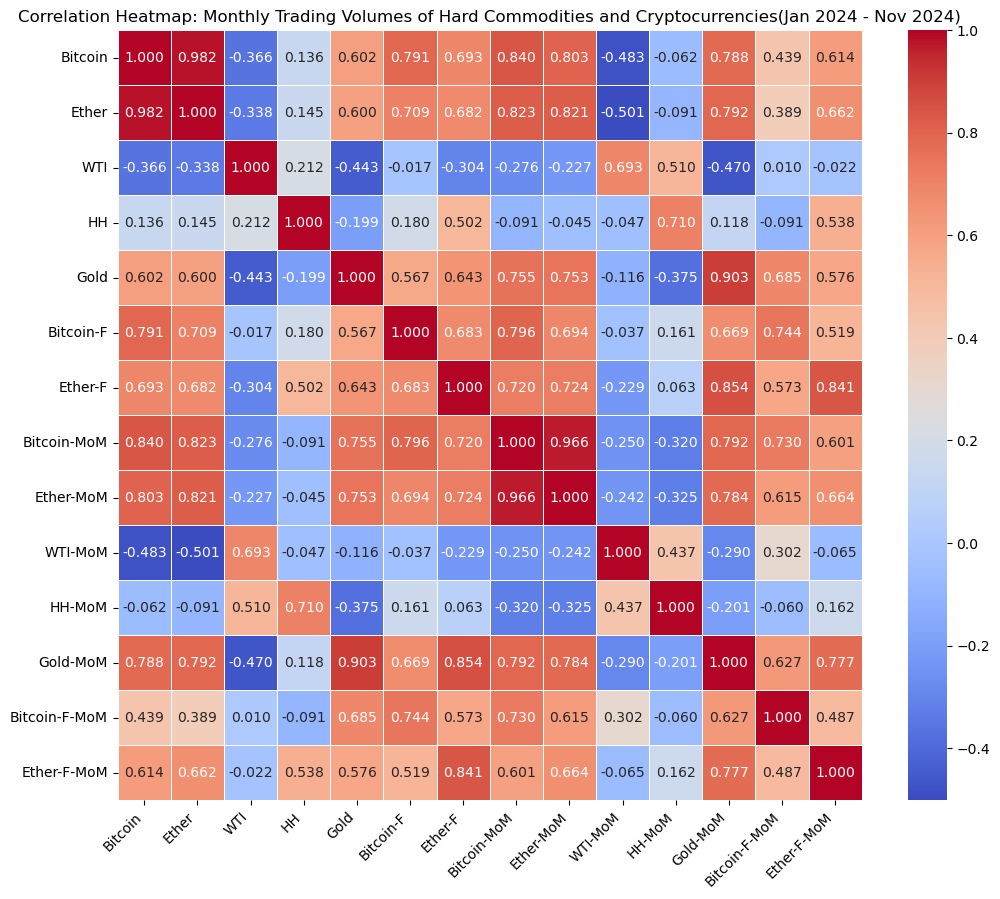

In [109]:
plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(test_corr_vol, annot=True, fmt=".3f", cmap='coolwarm', linewidths=0.5)

tick_labels = ["Bitcoin","Ether","WTI", "HH", "Gold","Bitcoin-F","Ether-F",
              "Bitcoin-MoM","Ether-MoM","WTI-MoM", "HH-MoM", "Gold-MoM","Bitcoin-F-MoM","Ether-F-MoM"]
heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Monthly Trading Volumes of Hard Commodities and Cryptocurrencies(Jan 2024 - Nov 2024)')

plt.savefig('outputs/heatmap_tradingVolumes2.png')

plt.show()

In [110]:
# Volume MoM change - 2024 (Jan-Nov)
variables = ['volume_b_MoM', 'volume_eth_MoM']
legend_labels = ['Bitcoin(Spot)-Volume', 'Ether(Spot)-Volume',]


plot_MoM_pct_change(
    variables=variables,
    seasonal_df=seasonal_vol,
    year=2024,
    legend_labels=legend_labels,
    title_name="Volume(Cryptocurrencies)"
)

In [111]:
# Volume: MoM percentage change - 2024 (Jan-Nov)

variables = ['volume_wti_MoM','volume_ng_MoM','volume_b_MoM']
legend_labels = ['WTI-Volume','HH-Volume','Bitcoin(Spot)-Volume']

# variables = ['volume_wti_MoM','volume_ng_MoM','volume_gold_MoM','volume_b_MoM']
# legend_labels = ['WTI-Volume','HH-Volume','Gold(Futures)-Volume','Bitcoin(Spot)-Volume']


plot_MoM_pct_change(
    variables=variables,
    seasonal_df=seasonal_vol,
    year=2024,
    legend_labels=legend_labels,
    title_name="Volume"
)